In [46]:
!pip install --upgrade plotly
!pip install jupyter-dash
!pip install cufflinks --upgrade
!pip install ftfy
!pip install langdetect
# !pip install googletrans
!pip install goslate

Requirement already up-to-date: plotly in /usr/local/lib/python3.7/dist-packages (4.14.3)
Requirement already up-to-date: cufflinks in /usr/local/lib/python3.7/dist-packages (0.17.3)


In [2]:
import warnings
warnings.filterwarnings('ignore') 

# Utilities
from time import time
import os, sys, itertools, re
import warnings, string
from ftfy import fix_encoding, fix_text, badness
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Numerical calculation
import numpy as np

# Data Handling
import pandas as pd

# Data Visualization
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import seaborn as sns
import cufflinks as cf
import plotly as py
import plotly.express as px
import plotly.graph_objs as go
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from IPython.display import HTML

init_notebook_mode(connected=False)
cf.go_offline()
%matplotlib inline

#NLP
import string
import re
from collections import Counter
from langdetect import detect
import nltk
from nltk.corpus import stopwords
from nltk import tokenize
from textblob import Word
from wordcloud import WordCloud, STOPWORDS 

# Tools & Evaluation metrics
from scipy.stats import zscore
from sklearn import preprocessing
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import label_binarize
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.metrics import roc_curve, roc_auc_score, auc, accuracy_score, confusion_matrix, f1_score, classification_report, precision_recall_curve, precision_recall_fscore_support
from sklearn.model_selection import train_test_split

# Traditional Modeling
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

# Deep learning models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.optimizers import SGD

# Translation APIs
from goslate import Goslate # Provided by Google

In [47]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [3]:
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
 from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [24]:
project_path =  ('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/')
file_name ='input_data.xlsx'

ticket_df = pd.read_excel(project_path+file_name)
ticket_df.head(5)

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [25]:
ticket_df.describe()

,Short description,Description,Caller,Assignment group
count,8492,8499,8500,8500
unique,7481,7817,2950,74
top,password reset,the,bpctwhsn kzqsbmtp,GRP_0
freq,38,56,810,3976


In [26]:
ticket_df['Assignment group'].value_counts()

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
          ... 
GRP_73       1
GRP_64       1
GRP_70       1
GRP_67       1
GRP_61       1
Name: Assignment group, Length: 74, dtype: int64

In [27]:
ticket_df['Assignment group'].unique()

array(['GRP_0', 'GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7',
       'GRP_8', 'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73'],
      dtype=object)

In [28]:
len(ticket_df['Assignment group'].unique())

74

Dataset contains 74 unique Assignment Groups

In [29]:
tkt_df = ticket_df['Assignment group'].value_counts().reset_index()
tkt_df['percentage'] = (tkt_df['Assignment group']/tkt_df['Assignment group'].sum())*100
tkt_df.head()

,index,Assignment group,percentage
0,GRP_0,3976,46.776471
1,GRP_8,661,7.776471
2,GRP_24,289,3.400000
3,GRP_12,257,3.023529
4,GRP_9,252,2.964706


## **EXPLORATORY DATA ANALYSIS**

### **Basic Data Cleaning**

In [30]:
ticket_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [31]:
ticket_df.isnull().sum()

Short description    8
Description          1
Caller               0
Assignment group     0
dtype: int64

There are null values in columns - 'Short description' & 'Description'

In [32]:
ticket_df[pd.isnull(ticket_df).any(axis=1)]

,Short description,Description,Caller,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0



Remove null values by converting it to string

In [33]:
# Convert datatype to string
ticket_df = ticket_df.applymap(str)
ticket_df.count()

Short description    8500
Description          8500
Caller               8500
Assignment group     8500
dtype: int64

In [34]:
ticket_df[pd.isnull(ticket_df).any(axis=1)]

,Short description,Description,Caller,Assignment group


In [35]:
ticket_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8500 non-null   object
 1   Description        8500 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [36]:
#Concatenate Short Description and Description columns
ticket_df['Full_Description'] = ticket_df['Short description'] + ' ' +ticket_df['Description']
ticket_df.head(15)

,Short description,Description,Caller,Assignment group,Full_Description
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1,event: critical:HostName_221.company.com the v...
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0,ticket_no1550391- employment status - new non-...
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,unable to disable add ins on outlook unable to...
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0,ticket update on inplant_874773 ticket update ...


In [37]:
#Detect and corrected data with Mojibakes

def is_mojibake_impacted(text):
    if not badness.badness(text):
        # nothing weird, should be okay
        return True
    try:
        text.encode('sloppy-windows-1252')
    except UnicodeEncodeError:
        # Not CP-1252 encodable, probably fine
        return True
    else:
        # Encodable as CP-1252, Mojibake alert level high
        return False
    
# Check the dataset for mojibake impact
ticket_df[~ticket_df.iloc[:,:-1].applymap(is_mojibake_impacted).all(1)]

,Short description,Description,Caller,Assignment group,Full_Description
99,password expiry tomorrow,\n\nreceived from: ecprjbod.litmjwsy@gmail.com...,ecprjbod litmjwsy,GRP_0,password expiry tomorrow \n\nreceived from: ec...
116,server issues,\r\n\r\nreceived from: bgqpotek.cuxakvml@gmail...,bgqpotek cuxakvml,GRP_0,server issues \r\n\r\nreceived from: bgqpotek....
124,mobile device activation,"from: tvcdfqgp nrbcqwgj \nsent: friday, octobe...",tvcdfqgp nrbcqwgj,GRP_0,mobile device activation from: tvcdfqgp nrbcqw...
162,access to bex,\r\n\r\nreceived from: yfqoaepn.xnezhsit@gmail...,yfqoaepn xnezhsit,GRP_0,access to bex \r\n\r\nreceived from: yfqoaepn....
164,æ’¤å›ž: ticket_no1564867 -- comments added,\n\nreceived from: abcdri@company.com\n\nwindy...,tycludks cjofwigv,GRP_0,æ’¤å›ž: ticket_no1564867 -- comments added \n\...
...,...,...,...,...,...
8470,please review your recent ticketing_tool ticke...,"from: mikhghytr wafglhdrhjop \nsent: thursday,...",azxhejvq fyemlavd,GRP_16,please review your recent ticketing_tool ticke...
8471,ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥,to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥,xqyjztnm onfusvlz,GRP_30,ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥ to å°è´ºï¼Œæ—©ä¸Šç”µ...
8480,customer group enhanced field,\r\n\r\nreceived from: nlearzwi.ukdzstwi@gmail...,nlearzwi ukdzstwi,GRP_9,customer group enhanced field \r\n\r\nreceived...
8498,machine nÃ£o estÃ¡ funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,machine nÃ£o estÃ¡ funcionando i am unable to ...


In [38]:
ticket_df.iloc[8471,:]

Short description                             ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Description                 to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Caller                                               xqyjztnm onfusvlz
Assignment group                                                GRP_30
Full_Description     ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥ to å°è´ºï¼Œæ—©ä¸Šç”µ...
Name: 8471, dtype: object

In [39]:
ticket_df['Full_Description'] = ticket_df['Full_Description'].apply(fix_text)

In [40]:
ticket_df.iloc[8471,:]

Short description                      ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Description          to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Caller                                        xqyjztnm onfusvlz
Assignment group                                         GRP_30
Full_Description                      电脑开机开不出来 to 小贺,早上电脑开机开不出来
Name: 8471, dtype: object

The converted mojibakes data seems to be Mandarin. Thus there is presence of other non-english language that need to be converted.

**Language detection**

In [41]:
def fn_lan_detect(df):                                        
   try:   
      # print("lang: ", detect(df))                                                       
      return detect(df)                                      
   except:                                                       
      return 'no'                                                  

ticket_df['language'] = ticket_df['Full_Description'].apply(fn_lan_detect)

In [42]:
ticket_df.iloc[8471,:]

Short description                      ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Description          to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Caller                                        xqyjztnm onfusvlz
Assignment group                                         GRP_30
Full_Description                      电脑开机开不出来 to 小贺,早上电脑开机开不出来
language                                                  zh-cn
Name: 8471, dtype: object

In [43]:
ticket_df["language"].value_counts()

en       7094
de        414
af        264
it        121
fr        112
nl         61
no         61
sv         55
es         50
zh-cn      50
ca         45
pl         30
da         30
pt         19
ko         16
tl         11
et         11
ro         10
cy          9
hr          7
sq          6
id          5
fi          4
sl          4
so          3
vi          2
lt          2
cs          2
lv          1
tr          1
Name: language, dtype: int64

In [44]:
lang_count = ticket_df["language"].value_counts().reset_index()
lang_count

,index,language
0,en,7094
1,de,414
2,af,264
3,it,121
4,fr,112
5,nl,61
6,no,61
7,sv,55
8,es,50
9,zh-cn,50


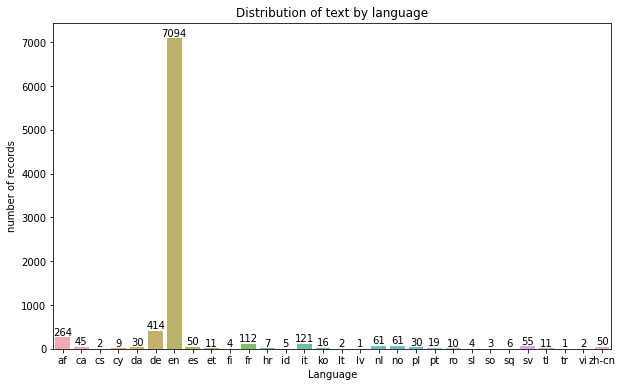

In [45]:
x = ticket_df["language"].value_counts()
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x=x.index,y= x.values, alpha=0.8)
plt.title("Distribution of text by language")
plt.ylabel('number of records')
plt.xlabel('Language')
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

**Observation**

*   We can see that most of the tickets are in english, followed by tickets in German language. 
*   We need to translate these into english.



**Data Cleaning**

In [46]:
ticket_df.head()

,Short description,Description,Caller,Assignment group,Full_Description,language
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,en
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \n\nreceived from: hmjdrvpb.komuaywn@g...,en
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \n\nreceived from: eylqgodm...,en
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,en
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,no


Most Common words before data cleaning and removing stop words

In [47]:
wd_counts = Counter()
for i, row in ticket_df.iterrows():
    wd_counts.update(row['Full_Description'].split())
    
wd_counts.most_common(20)

[('to', 8446),
 ('the', 7020),
 ('in', 4909),
 ('is', 3525),
 ('on', 2891),
 ('not', 2851),
 ('and', 2758),
 ('for', 2629),
 ('from:', 2499),
 ('i', 2432),
 ('received', 2371),
 ('a', 2012),
 ('job', 1975),
 ('please', 1946),
 ('password', 1865),
 ('of', 1845),
 ('erp', 1827),
 ('failed', 1700),
 ('job_scheduler', 1629),
 ('at:', 1614)]

In [48]:
### Make text lowercase, remove text in square brackets,remove links,remove punctuation and remove words containing numbers

def clean_text(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text=text.replace(('first name: ').lower(),'firstname')
    text=text.replace(('last name: ').lower(),'lastname')
    text=text.replace(('received from:').lower(),'')
    text=text.replace('email:','')
    text=text.replace('email address:','') 
    index1=text.find('from:')
    index2=text.find('\nsddubject:')
    text=text.replace(text[index1:index2],'')
    index3=text.find('[cid:image')
    index4=text.find(']')
    text=text.replace(text[index3:index4],'')
    text=text.replace('subject:','')
    text=text.replace('received from:','')
    text=text.replace('this message was sent from an unmonitored email address', '')
    text=text.replace('please do not reply to this message', '')
    text=text.replace('monitoring_tool@company.com','MonitoringTool')
    text=text.replace('select the following link to view the disclaimer in an alternate language','')
    text=text.replace('description problem', '') 
    text=text.replace('steps taken far', '')
    text=text.replace('customer job title', '')
    text=text.replace('sales engineer contact', '')
    text=text.replace('description of problem:', '')
    text=text.replace('steps taken so far', '')
    text=text.replace('please do the needful', '')
    text=text.replace('please note that ', '')
    text=text.replace('please find below', '')
    text=text.replace('date and time', '')
    text=text.replace('kindly refer mail', '')
    text=text.replace('name:', '')
    text=text.replace('language:', '')
    text=text.replace('customer number:', '')
    text=text.replace('telephone:', '')
    text=text.replace('summary:', '')
    text=text.replace('sincerely', '')
    text=text.replace('company inc', '')
    text=text.replace('importance:', '')
    text=text.replace('gmail.com', '')
    text=text.replace('company.com', '')
    text=text.replace('microsoftonline.com', '')
    text=text.replace('company.onmicrosoft.com', '')
    text=text.replace('hello', '')
    text=text.replace('hallo', '')
    text=text.replace('hi it team', '')
    text=text.replace('hi team', '')
    text=text.replace('hi', '')
    text=text.replace('best', '')
    text=text.replace('kind', '')
    text=text.replace('regards', '')
    text=text.replace('good morning', '')
    text=text.replace('good afternoon', '')
    text=text.replace('good evening', '')
    text=text.replace('please', '')
    text=text.replace('regards', '')
    text=text.replace('NaN','')
    text=text.replace('can''t','cannot')
    text=text.replace('i''ve','i have')
    text = re.sub(r'\S+@\S+', '', text)
    #custom_punctuation='!"#$%&\'()*+,-./:;<=>?@[\\]^`{|}~'
    text = re.sub(r'\w*\d\w*', '', text)
    text = re.sub(r'\[.*?\]', '', text)
    text = re.sub(r'https?://\S+|www\.\S+', '', text)
    text = re.sub(r'<.*?>+', '', text)
    text = re.sub(r'[%s]' % re.escape(string.punctuation), ' ', text)
    text = re.sub(r'\r\n', '', text)
    text = re.sub(r'\n', '', text)
    text = re.sub(r'\S+@\S+', '', text)
    text = re.sub(r'\t', '', text)

    text = text.lower()
    return text

In [49]:
ticket_df['cleaned_description'] = ticket_df['Full_Description'].apply(lambda x: clean_text(x))


In [50]:
ticket_df.drop(['Full_Description'],axis=1,inplace=True)

In [51]:
ticket_df['cleaned_description'].head()

0    login issue  verified user details  employee  ...
1    outlook  hmjdrvpb komuaywn  team my meetings s...
2    cannot log in to vpn  eylqgodm ybqkwiam i cann...
3    unable to access hr tool page unable to access...
4                            skype error  skype error 
Name: cleaned_description, dtype: object

In [52]:
def replace(str1, str2):
    return str1.replace(str2, '')

ticket_df['cleaned_description'] = ticket_df.apply(lambda row: replace(row['cleaned_description'], row['Caller']), axis=1)


In [53]:
ticket_df['cleaned_description']

0       login issue  verified user details  employee  ...
1       outlook    team my meetings skype meetings etc...
2          cannot log in to vpn   i cannot log on to vpn 
3       unable to access hr tool page unable to access...
4                               skype error  skype error 
                              ...                        
8495    emails not coming in from zz mail    i am not ...
8496    telephony software issue telephony software issue
8497      windows password reset for tifpdchb pedxruyf...
8498    macne não está funcionando i am unable to acce...
8499    an mehreren pc s lassen sich verscedene prgram...
Name: cleaned_description, Length: 8500, dtype: object

In [54]:
from collections import OrderedDict
ticket_df['cleaned_description'] = (ticket_df['cleaned_description'].str.split()
                              .apply(lambda x: OrderedDict.fromkeys(x).keys())
                              .str.join(' '))

In [55]:
ticket_df['cleaned_description'].head()

0    login issue verified user details employee man...
1    outlook team my meetings skype etc are not app...
2                            cannot log in to vpn i on
3                        unable to access hr tool page
4                                          skype error
Name: cleaned_description, dtype: object

In [56]:
wd_counts = Counter()
for i, row in ticket_df.iterrows():
    wd_counts.update(row['cleaned_description'].split())
    
wd_counts.most_common(20)

[('to', 3199),
 ('in', 2752),
 ('the', 2438),
 ('is', 1867),
 ('not', 1670),
 ('on', 1559),
 ('and', 1477),
 ('for', 1431),
 ('at', 1430),
 ('i', 1287),
 ('a', 1117),
 ('it', 1080),
 ('erp', 1053),
 ('password', 1029),
 ('have', 1021),
 ('job', 1007),
 ('of', 996),
 ('scheduler', 968),
 ('tool', 882),
 ('failed', 877)]

In [57]:
uni_df_with_stopw = pd.DataFrame(wd_counts.most_common(20), columns =['Words', 'Count'])

In [58]:
uni_df_with_stopw

,Words,Count
0,to,3199
1,in,2752
2,the,2438
3,is,1867
4,not,1670
5,on,1559
6,and,1477
7,for,1431
8,at,1430
9,i,1287


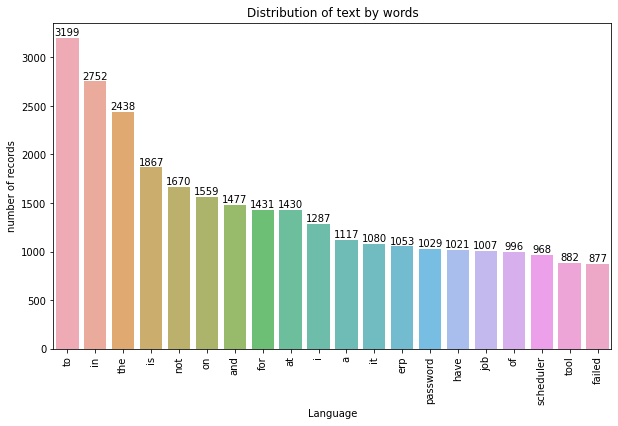

In [59]:
x = uni_df_with_stopw
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x=x.Words, y=x.Count, alpha=0.8)
plt.title("Distribution of text by words")
plt.ylabel('number of records')
plt.xlabel('Language')
plt.xticks(rotation=90)
rects = ax.patches
labels = x.Count
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

Need to remove stop words and unnecessary words that do not add meaning to the content.

**Remove stop words**

In [60]:
stop = stopwords.words('english')
ticket_df['cleaned_description'] = ticket_df['cleaned_description'].apply(lambda x: " ".join(x for x in str(x).split() if x not in stop))
ticket_df['cleaned_description'].head()

0    login issue verified user details employee man...
1    outlook team meetings skype etc appearing cale...
2                                       cannot log vpn
3                           unable access hr tool page
4                                          skype error
Name: cleaned_description, dtype: object

**Lemmatization**

In [61]:
## Lemmatization
ticket_df['cleaned_description']= ticket_df['cleaned_description'].apply(lambda x: " ".join([Word(word).lemmatize() for word in str(x).split()]))
ticket_df['cleaned_description'].head()

0    login issue verified user detail employee mana...
1    outlook team meeting skype etc appearing calen...
2                                       cannot log vpn
3                           unable access hr tool page
4                                          skype error
Name: cleaned_description, dtype: object

In [62]:
wd_counts = Counter()
for i, row in ticket_df.iterrows():
    wd_counts.update(row['cleaned_description'].split())
    
wd_counts.most_common(20)

[('password', 1176),
 ('erp', 1053),
 ('job', 1029),
 ('scheduler', 968),
 ('issue', 960),
 ('tool', 937),
 ('failed', 877),
 ('unable', 871),
 ('reset', 855),
 ('t', 810),
 ('user', 808),
 ('monitoringtooljob', 785),
 ('access', 679),
 ('error', 673),
 ('account', 660),
 ('need', 659),
 ('working', 608),
 ('company', 604),
 ('help', 559),
 ('email', 550)]

In [63]:
uni_df = pd.DataFrame(wd_counts.most_common(20), columns =['Words', 'Count'])

In [64]:
uni_df

,Words,Count
0,password,1176
1,erp,1053
2,job,1029
3,scheduler,968
4,issue,960
5,tool,937
6,failed,877
7,unable,871
8,reset,855
9,t,810


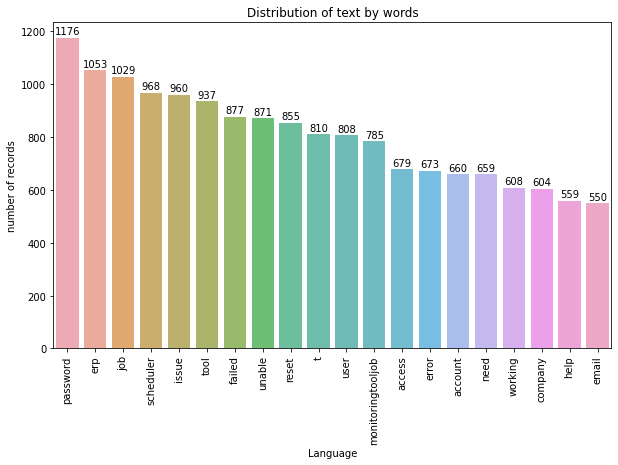

In [65]:
x = uni_df
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x=x.Words, y=x.Count, alpha=0.8)
plt.title("Distribution of text by words")
plt.ylabel('number of records')
plt.xlabel('Language')
plt.xticks(rotation=90)
rects = ax.patches
labels = x.Count
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

**Observations**

*   Before cleaning data and removing stop words the data had common words as articals, consconants, prepositions. etc
*   After cleaning the common words now look like words that would help in predicting.



In [66]:
ticket_df['descr_len'] = ticket_df['cleaned_description'].apply(lambda x: len(x))
ticket_df['descr_len'].mean()

86.72976470588236

In [67]:
print(ticket_df['descr_len'].max())
print(ticket_df['descr_len'].min())

3150
0


In [68]:
ticket_df['num_wds'] = ticket_df['cleaned_description'].apply(lambda x: len(x.split()))
ticket_df['num_wds'].mean()

12.17635294117647

In [69]:
ticket_df['num_wds'].describe()

count    8500.000000
mean       12.176353
std        18.091077
min         0.000000
25%         4.000000
50%         7.000000
75%        15.000000
max       428.000000
Name: num_wds, dtype: float64

In [70]:
len(ticket_df[ticket_df['num_wds']==0])

2

**Drop tickets with just one word in Description**

In [71]:
ticket_df= ticket_df[ticket_df['num_wds']>1]

In [72]:
print(ticket_df['num_wds'].min())

2


In [73]:
def avg_word(sentence):
  words = sentence.split()
  return (sum(len(word) for word in words)/len(words))


ticket_df['avg_word'] = ticket_df['cleaned_description'].apply(lambda x: avg_word(str(x)))
ticket_df.head()

,Short description,Description,Caller,Assignment group,language,cleaned_description,descr_len,num_wds,avg_word
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,en,login issue verified user detail employee mana...,125,18,6.000000
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,en,outlook team meeting skype etc appearing calen...,75,11,5.909091
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,en,cannot log vpn,14,3,4.000000
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,en,unable access hr tool page,26,5,4.400000
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,no,skype error,11,2,5.000000


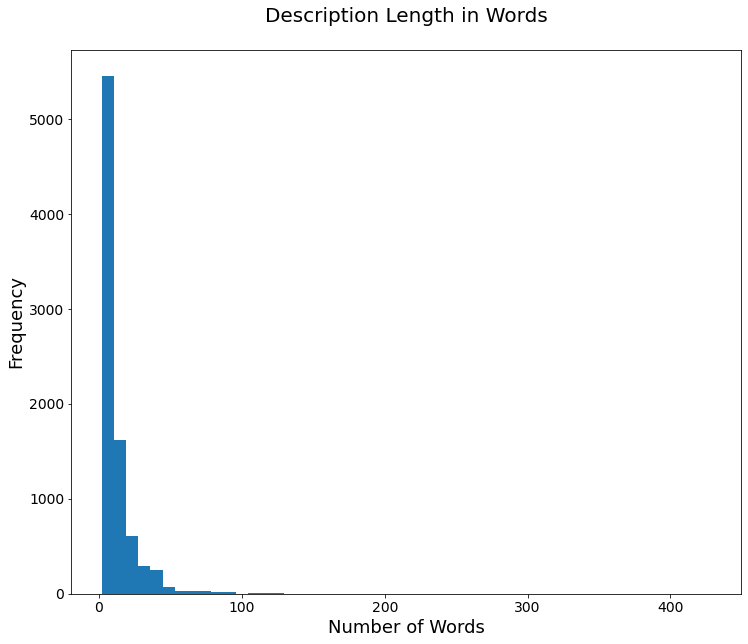

In [74]:
ax=ticket_df['num_wds'].plot(kind='hist', bins=50, fontsize=14, figsize=(12,10))
ax.set_title('Description Length in Words\n', fontsize=20)
ax.set_ylabel('Frequency', fontsize=18)
ax.set_xlabel('Number of Words', fontsize=18);

In [75]:
ticket_df['uniq_wds'] = ticket_df['cleaned_description'].str.split().apply(lambda x: len(set(x)))
ticket_df['uniq_wds'].head()

0    18
1    11
2     3
3     5
4     2
Name: uniq_wds, dtype: int64

In [76]:
ticket_df['uniq_wds'].describe()

count    8457.000000
mean       12.107958
std        17.674118
min         2.000000
25%         4.000000
50%         7.000000
75%        15.000000
max       415.000000
Name: uniq_wds, dtype: float64

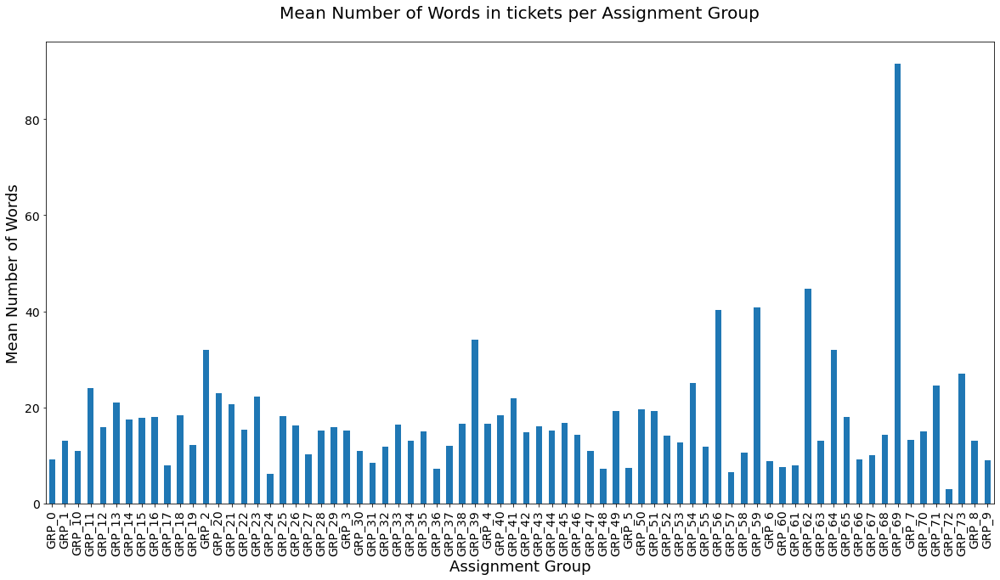

In [77]:
assign_grps = ticket_df.groupby('Assignment group')
ax=assign_grps['num_wds'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Words in tickets per Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

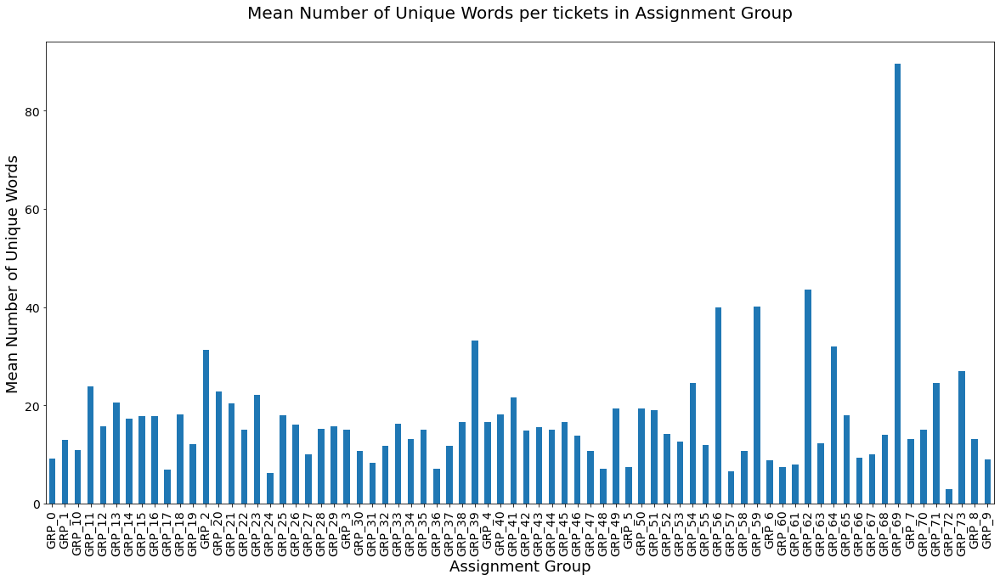

In [78]:
ax=assign_grps['uniq_wds'].aggregate(np.mean).plot(kind='bar', fontsize=14, figsize=(20,10))
ax.set_title('Mean Number of Unique Words per tickets in Assignment Group\n', fontsize=20)
ax.set_ylabel('Mean Number of Unique Words', fontsize=18)
ax.set_xlabel('Assignment Group', fontsize=18);

**Observations**

*   Group-56 has the highest amount of words but group-69 has the highest amount of unique words. 
*   Thus it means the group wth highest words doesnt necessarily have to contain meaningfull content. Also means there are more redundant words in them.



**Tokenization**

In [79]:
tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
ticket_df['tokenized_desc'] = ticket_df['cleaned_description'].apply(lambda x: tokenizer.tokenize(x))

In [80]:
ticket_df['tokenized_desc'].head()

0    [login, issue, verified, user, detail, employe...
1    [outlook, team, meeting, skype, etc, appearing...
2                                   [cannot, log, vpn]
3                     [unable, access, hr, tool, page]
4                                       [skype, error]
Name: tokenized_desc, dtype: object

In [81]:
def combine_text(list_of_text):
    combined_text = ' '.join(list_of_text)
    return combined_text

ticket_df['tokenized_desc'] = ticket_df['tokenized_desc'].apply(lambda x : combine_text(x))

In [82]:
ticket_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8457 entries, 0 to 8499
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Short description    8457 non-null   object 
 1   Description          8457 non-null   object 
 2   Caller               8457 non-null   object 
 3   Assignment group     8457 non-null   object 
 4   language             8457 non-null   object 
 5   cleaned_description  8457 non-null   object 
 6   descr_len            8457 non-null   int64  
 7   num_wds              8457 non-null   int64  
 8   avg_word             8457 non-null   float64
 9   uniq_wds             8457 non-null   int64  
 10  tokenized_desc       8457 non-null   object 
dtypes: float64(1), int64(3), object(7)
memory usage: 792.8+ KB


In [83]:
ticket_df.head()

,Short description,Description,Caller,Assignment group,language,cleaned_description,descr_len,num_wds,avg_word,uniq_wds,tokenized_desc
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,en,login issue verified user detail employee mana...,125,18,6.000000,18,login issue verified user detail employee mana...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,en,outlook team meeting skype etc appearing calen...,75,11,5.909091,11,outlook team meeting skype etc appearing calen...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,en,cannot log vpn,14,3,4.000000,3,cannot log vpn
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,en,unable access hr tool page,26,5,4.400000,5,unable access hr tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,no,skype error,11,2,5.000000,2,skype error


**Visualize percentage of tickets per assignment group**

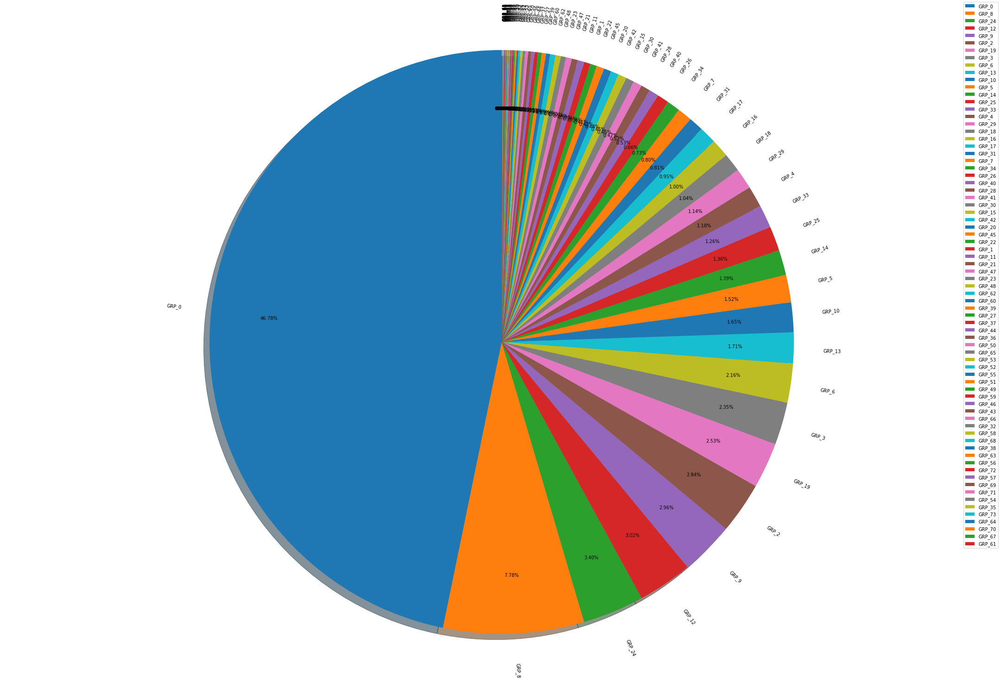

In [84]:
# Pie chart
fig1, ax1 = plt.subplots(figsize=(30, 20))
ax1.pie(tkt_df['percentage'], labels=tkt_df['index'], labeldistance=1.1, pctdistance=0.8, rotatelabels=90, autopct='%.2f%%', shadow=True, startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
fig1.legend(loc=0, prop={'size': 10})
plt.tight_layout()
plt.show()

Interactive plot

In [85]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

In [86]:
configure_plotly_browser_state()

# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', ticket_df['Assignment group'].nunique())

# Histogram
# ticket_df['Assignment group'].iplot(kind='hist', title='Assignment Group Distribution- Histogram')

# Pie chart
assgn_grp = pd.DataFrame(ticket_df.groupby('Assignment group').size(),columns = ['Count']).reset_index()
assgn_grp.iplot(kind='pie', labels='Assignment group', values='Count', title='Assignment Group Distribution', hoverinfo="label+percent+name", hole=0.25)

Total assignment groups: 74


**Pareto Chart**

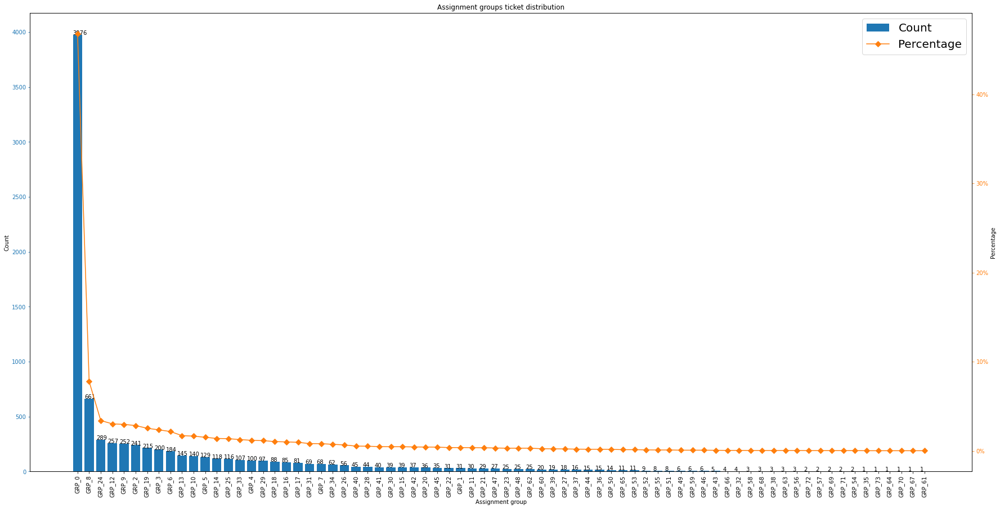

In [87]:
fig, ax = plt.subplots(1,1,figsize=(30, 15))
bars = ax.bar(tkt_df['index'], tkt_df['Assignment group'], color="C0", label = 'Count')
plt.xticks(rotation=90)
ax2 = ax.twinx()
ax2.plot(tkt_df.index, tkt_df["percentage"], color="C1", marker="D", ms=7, label = 'Percentage')
ax2.yaxis.set_major_formatter(PercentFormatter())

ax.tick_params(axis="y", colors="C0")
ax2.tick_params(axis="y", colors="C1")
lines_1, labels_1 = ax.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()

lines = lines_1 + lines_2
labels = labels_1 + labels_2

ax.legend(lines, labels, loc=0, prop={'size': 20})

ax.set_xlabel("Assignment group")
ax.set_ylabel("Count")
ax2.set_ylabel("Percentage")

plt.title('Assignment groups ticket distribution')

for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x(), yval + .005, yval)
plt.show()




**Observations**  


*   The data is highly skewed with 46.77% of the tickets present in the Group 0 followed by Group 8, 24, 12, 9, 2, 19
*   There are few Groups with less than 10 tickets and few with just 1 or 2 tickets. Have to consider dropping such tickets due to lack of sufficient data for prediction.



**Top 20 Assignment groups with highest number of tickets**

In [88]:
top_20_df = ticket_df['Assignment group'].value_counts().nlargest(20).reset_index()
top_20_df

,index,Assignment group
0,GRP_0,3956
1,GRP_8,660
2,GRP_24,277
3,GRP_12,257
4,GRP_9,252
5,GRP_2,241
6,GRP_19,215
7,GRP_3,198
8,GRP_6,182
9,GRP_13,145


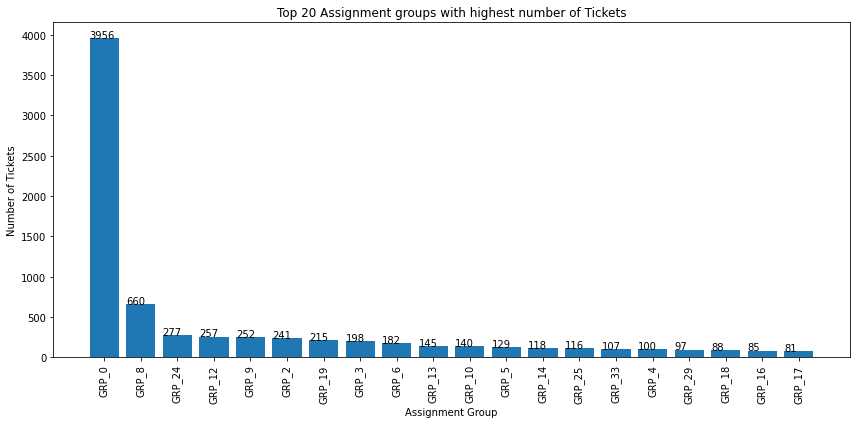

In [89]:
plt.figure(figsize=(12,6))
bars = plt.bar(top_20_df['index'],top_20_df['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

**Bottom 20 Assignment groups with lowest number of tickets**

In [90]:
bottom_20_df = ticket_df['Assignment group'].value_counts().nsmallest(20).reset_index()
bottom_20_df

,index,Assignment group
0,GRP_35,1
1,GRP_73,1
2,GRP_64,1
3,GRP_70,1
4,GRP_67,1
5,GRP_61,1
6,GRP_72,2
7,GRP_57,2
8,GRP_69,2
9,GRP_71,2


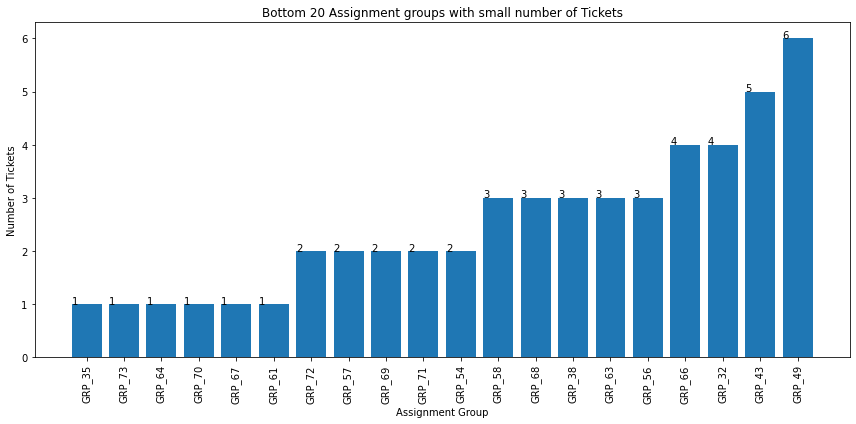

In [91]:
plt.figure(figsize=(12,6))
bars = plt.bar(bottom_20_df['index'],bottom_20_df['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

**Distribution of tickets within groups less than 30 tickets**

In [92]:
# Find out the Assignment Groups with less than equal to 30 tickets assigned
rare_ticket_df = ticket_df.groupby(['Assignment group']).filter(lambda x: len(x) <= 30)
print('Groups with less than equal to 30 tickets assigned:', rare_ticket_df['Assignment group'].nunique())

configure_plotly_browser_state()
rare_ticket_df['Assignment group'].iplot(kind='hist', xTitle='Assignment Group', yTitle='count', colorscale='-orrd', title='Records by rare Assignment Groups- Histogram')

plt.show()

Groups with less than equal to 30 tickets assigned: 40


In [93]:
df_range = pd.DataFrame(columns=['Range','Group_count'])
one_ticket = {'Range':'1 ticket','Group_count':len(tkt_df[tkt_df['Assignment group'] < 2])}
_2_5_ticket = {'Range':'2-5 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 1)& (tkt_df['Assignment group'] < 6) ])}
_10_ticket = {'Range':' 6-10 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 5)& (tkt_df['Assignment group'] < 11)])}
_10_20_ticket = {'Range':' 11-20 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 10)& (tkt_df['Assignment group'] < 21)])}
_20_50_ticket = {'Range':' 21-50 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 20)& (tkt_df['Assignment group'] < 51)])}
_51_100_ticket = {'Range':' 51-100 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 50)& (tkt_df['Assignment group'] < 101)])}
_100_ticket = {'Range':' >100 ticket',
              'Group_count':len(tkt_df[(tkt_df['Assignment group'] > 100)])}
#append row to the dataframe
df_range = df_range.append([one_ticket,_2_5_ticket,_10_ticket,
                          _10_20_ticket,_20_50_ticket,_51_100_ticket,_100_ticket], ignore_index=True)

df_range

,Range,Group_count
0,1 ticket,6
1,2-5 ticket,13
2,6-10 ticket,6
3,11-20 ticket,9
4,21-50 ticket,16
5,51-100 ticket,9
6,>100 ticket,15


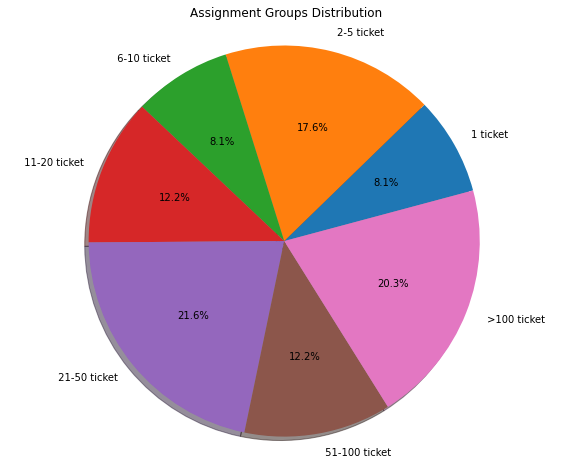

In [94]:
plt.figure(figsize=(10, 8))
plt.pie(df_range['Group_count'],labels=df_range['Range'],autopct='%1.1f%%', startangle=15, shadow = True);
plt.title('Assignment Groups Distribution')
plt.axis('equal');

**Observations**

*   Top 5 groups with hightest tickets are - 0, 8, 24, 12, 9
*   Bottom 5 groups with lowest tickets are - 70, 64, 67, 73, 35
*   There are 40 groups with just 30 or less tickets assigned, amongst which 6 groups happened to be assigned with just 1 ticket, 4 groups with just 2 tickets each and 5 groups with 3 tickets each.
*   There are 15 assignment groups that has more than 100 tickets which accounts to only 20.3% of the overall dataset.







In [95]:
ticket_df.head()

,Short description,Description,Caller,Assignment group,language,cleaned_description,descr_len,num_wds,avg_word,uniq_wds,tokenized_desc
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,en,login issue verified user detail employee mana...,125,18,6.000000,18,login issue verified user detail employee mana...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,en,outlook team meeting skype etc appearing calen...,75,11,5.909091,11,outlook team meeting skype etc appearing calen...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,en,cannot log vpn,14,3,4.000000,3,cannot log vpn
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,en,unable access hr tool page,26,5,4.400000,5,unable access hr tool page
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,no,skype error,11,2,5.000000,2,skype error


**Drop groups that has just one ticket each**

In [96]:
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_73')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_60')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_35')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_70')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_64')].index , inplace=True)
ticket_df.drop(ticket_df[(ticket_df['Assignment group'] == 'GRP_67')].index , inplace=True)

In [97]:
ticket_df.shape

(8432, 11)

In [98]:
ticket_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8432 entries, 0 to 8499
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Short description    8432 non-null   object 
 1   Description          8432 non-null   object 
 2   Caller               8432 non-null   object 
 3   Assignment group     8432 non-null   object 
 4   language             8432 non-null   object 
 5   cleaned_description  8432 non-null   object 
 6   descr_len            8432 non-null   int64  
 7   num_wds              8432 non-null   int64  
 8   avg_word             8432 non-null   float64
 9   uniq_wds             8432 non-null   int64  
 10  tokenized_desc       8432 non-null   object 
dtypes: float64(1), int64(3), object(7)
memory usage: 790.5+ KB


### **Word Cloud**

In [99]:
def f_word_cloud(column):
    
    comment_words = ' '
    stopwords = set(STOPWORDS)

    # iterate through the csv file 
    for val in column: 

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens: 
            comment_words = comment_words + words + ' '


    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10).generate(comment_words) 
    
    return wordcloud

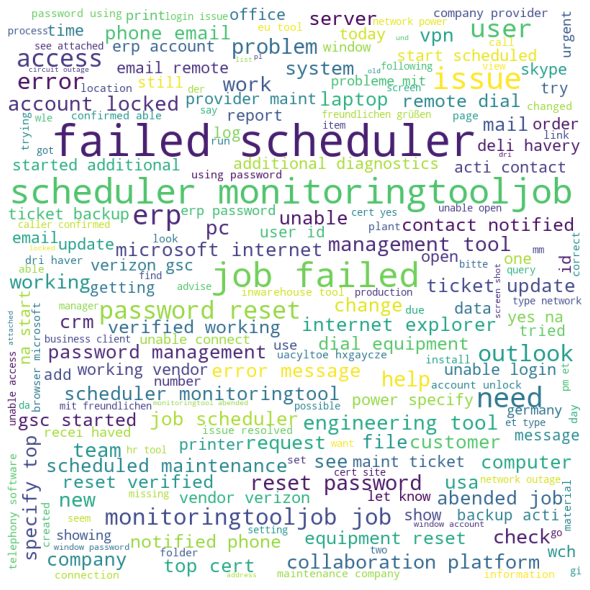

In [101]:
wordcloud = f_word_cloud(ticket_df.cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

**Top 4 Group word cloud to understand the group's field of operation**

**Group 0**

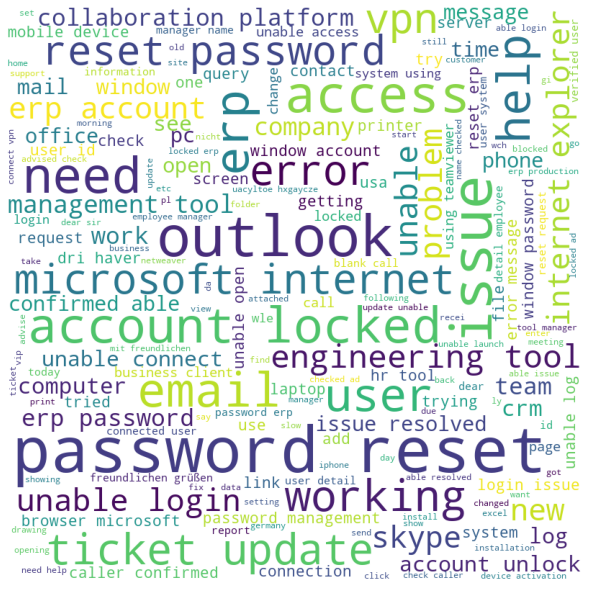

In [102]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Assignment group']=='GRP_0'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [103]:
ticket_df[ticket_df["cleaned_description"].str.contains("account lock")]["Assignment group"].value_counts()

GRP_0     242
GRP_2       5
GRP_1       1
GRP_72      1
GRP_34      1
GRP_31      1
GRP_14      1
Name: Assignment group, dtype: int64

In [104]:
ticket_df[ticket_df["cleaned_description"].str.contains("password reset")]["Assignment group"].value_counts()

GRP_0     343
GRP_2       5
GRP_7       2
GRP_12      1
Name: Assignment group, dtype: int64

**Observations**

*   Group 0 seems to have ticket issue related to password resert, access issues , login issue, etc. Seem to be an L1 category issues to be resolved.
*   Groups that have similar common words as group-0 are group- 2,7,12,14,17 etc.




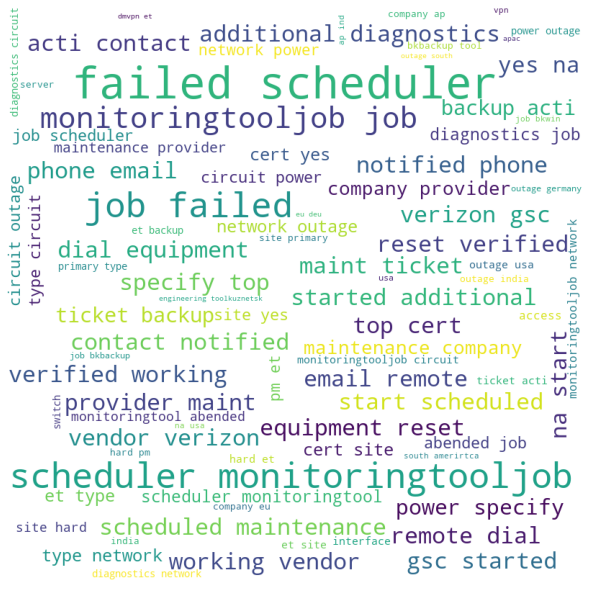

In [105]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Assignment group']=='GRP_8'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [106]:
ticket_df[ticket_df["cleaned_description"].str.contains("jobscheduler")]["Assignment group"].value_counts()

Series([], Name: Assignment group, dtype: int64)

In [107]:
ticket_df[ticket_df["cleaned_description"].str.contains("outage")]["Assignment group"].value_counts()

GRP_8     141
GRP_4      17
GRP_0      10
GRP_37      1
GRP_16      1
Name: Assignment group, dtype: int64

**Observations**

*   Group 8 have issues related to monitoring tool, scheduled maintenance, outage, job failure, etc.
*   These issues seems to be of higher priority and thus it cam be assumed to be L3 related issue.
*   Groups that has similar ticket issue key words as that of group 8 are group-9,6,5,10,4,47,0,45,12,1,13,14,29,18 etc.

We find that the similar groups in group 0 and 8 do not overlap and can see clear distinction in the type of field and level of work









**Comparison between Group-0(L1/L2) and Group-8(L3)**

In [108]:
ticket_df_level = ticket_df.copy()
ticket_df_level['Target'] = np.where(ticket_df_level['Assignment group']=='GRP_0','L1/L2',np.where(ticket_df_level['Assignment group'] =='GRP_8','L1/L2','L3'))

Text(0, 0.5, 'tickets')

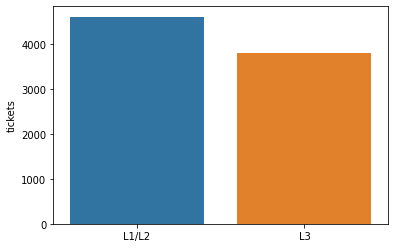

In [109]:
x=ticket_df_level.Target.value_counts()
sns.barplot(x.index,x)
plt.gca().set_ylabel('tickets')

**Observations** - L1/L2 type ticket counts are quiet higher than L3 tickets in the dataset

**Group-12**

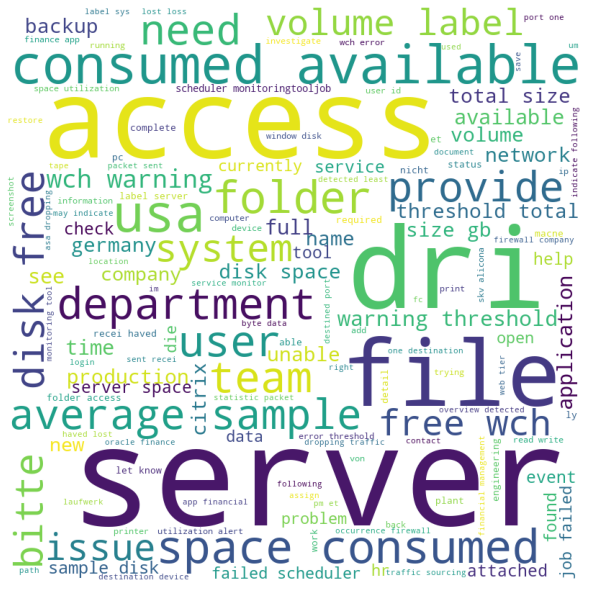

In [110]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Assignment group']=='GRP_12'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

**Observations** - Group-12 tickets mostly revolve around server, asa deny, dst outside, outside access.

**Group-24**

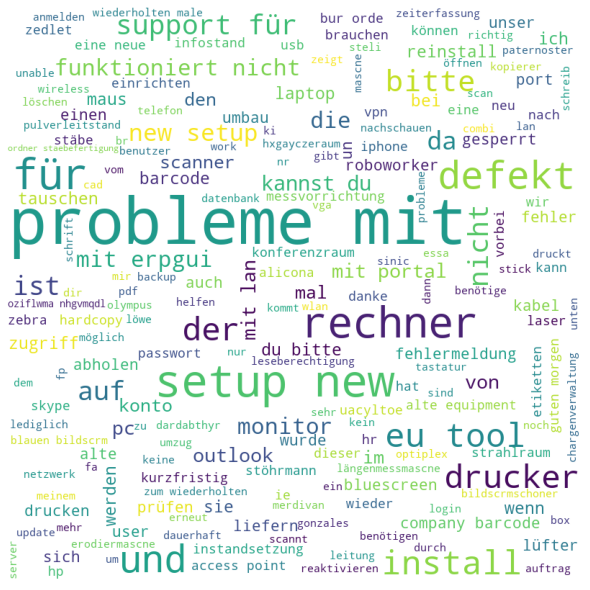

In [111]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Assignment group']=='GRP_24'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

**Observations** - Group-24 consist of german language which needs translation

### **Caller Distribution Analysis**

In [112]:
len(ticket_df['Caller'].unique())

2942

In [113]:
ticket_df.groupby("Caller").size()

Caller
DEsowkrH sciejzNE      2
HdOuWxAt qfKdlJMx      1
ZkBogxib QsEJzdZO    151
abiuclvj brziktno      1
abtknpew ifcekjdb      1
                    ... 
zylaexnv pvkzbduh      3
zylwdbig wdkbztjp      1
zymdwqsi jzvbthil      1
zywoxerf paqxtrfk      9
zyxjagro vjgozhpn      2
Length: 2942, dtype: int64

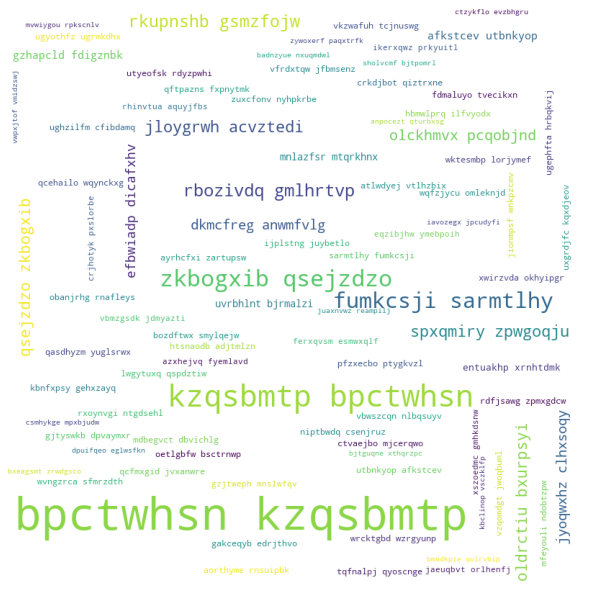

In [114]:
wordcloud = f_word_cloud(ticket_df.Caller)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [115]:
fig1 = px.histogram(ticket_df, x="Caller")
HTML(fig1.to_html())

In [116]:
top_10_caller_df = ticket_df['Caller'].value_counts().nlargest(10).reset_index()
top_10_caller_df

,index,Caller
0,bpctwhsn kzqsbmtp,794
1,ZkBogxib QsEJzdZO,151
2,fumkcsji sarmtlhy,134
3,rbozivdq gmlhrtvp,79
4,rkupnshb gsmzfojw,71
5,jloygrwh acvztedi,62
6,spxqmiry zpwgoqju,62
7,oldrctiu bxurpsyi,57
8,olckhmvx pcqobjnd,54
9,dkmcfreg anwmfvlg,51


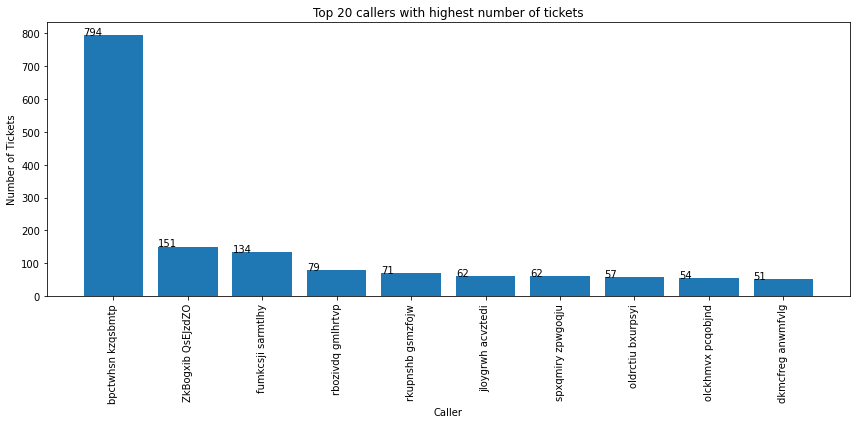

In [117]:
plt.figure(figsize=(12,6))
bars = plt.bar(top_10_caller_df['index'],top_10_caller_df['Caller'])
plt.title('Top 20 callers with highest number of tickets')
plt.xlabel('Caller')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

**Top 4 caller word cloud**

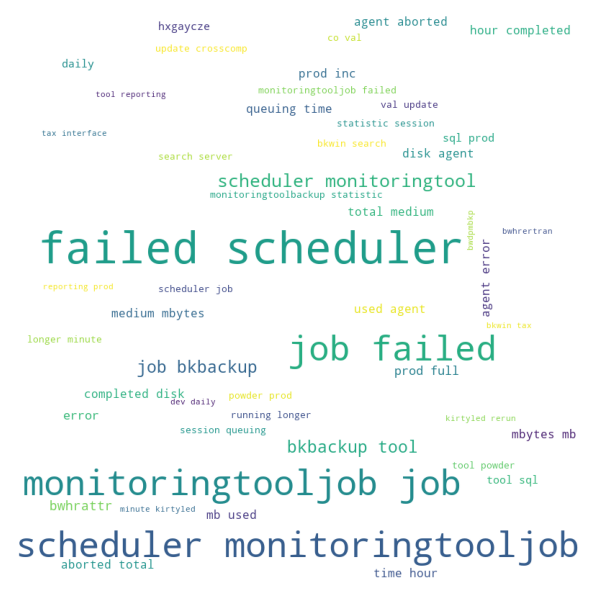

In [118]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Caller']=='bpctwhsn kzqsbmtp'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

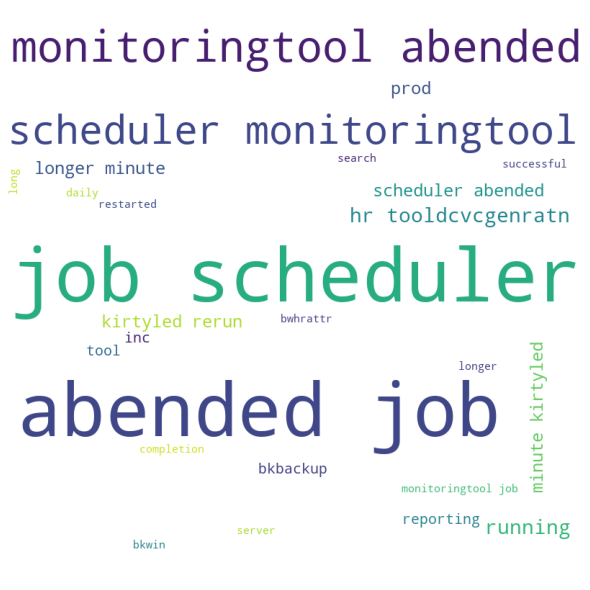

In [119]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Caller']=='ZkBogxib QsEJzdZO'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

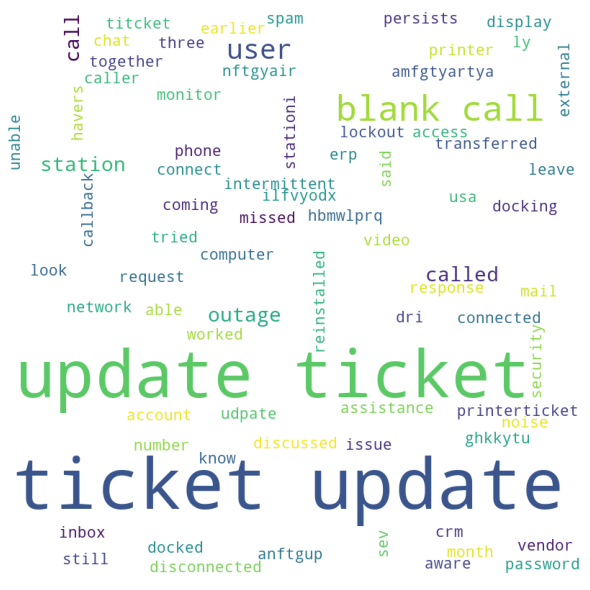

In [120]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Caller']=='fumkcsji sarmtlhy'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

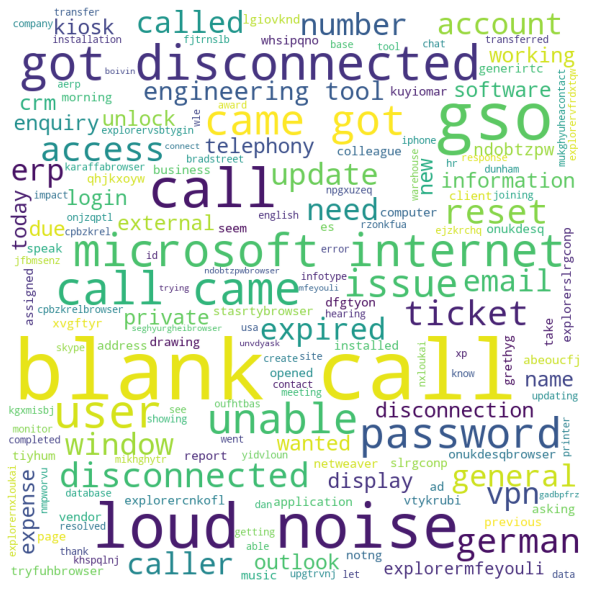

In [121]:
wordcloud = f_word_cloud(ticket_df[ticket_df['Caller']=='rbozivdq gmlhrtvp'].cleaned_description)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

**Observations**

*   The top caller "bpctwhsn kzqsbmtp" & "ZkBogxib QsEJzdZO" mostly addresses issues related to job_scheduler, monitoring tool.
*   Caller "fumkcsji sarmtlhy" tickets are related to ticket updates and specific ticket related issues.
*   Caller "rbozivdq gmlhrtvp" are mostly related to basic front desk resolvable issues such as loud noise, general enquiry, loud noise etc.

In [122]:
# Top 5 callers in each assignment group
top_n = 5
s = ticket_df['Caller'].groupby(ticket_df['Assignment group']).value_counts()
caller_grp = pd.DataFrame(s.groupby(level=0).nlargest(top_n).reset_index(level=0, drop=True))
caller_grp.head(15)

Caller
Assignment group Caller                   
GRP_0            fumkcsji sarmtlhy     132
                 rbozivdq gmlhrtvp      78
                 olckhmvx pcqobjnd      54
                 efbwiadp dicafxhv      45
                 mfeyouli ndobtzpw      13
GRP_1            bpctwhsn kzqsbmtp       6
                 jloygrwh acvztedi       4
                 jyoqwxhz clhxsoqy       3
                 spxqmiry zpwgoqju       3
                 kbnfxpsy gehxzayq       2
GRP_10           bpctwhsn kzqsbmtp      60
                 ihfkwzjd erbxoyqk       6
                 dizquolf hlykecxa       5
                 gnasmtvx cwxtsvkm       3
                 hlrmufzx qcdzierm       3

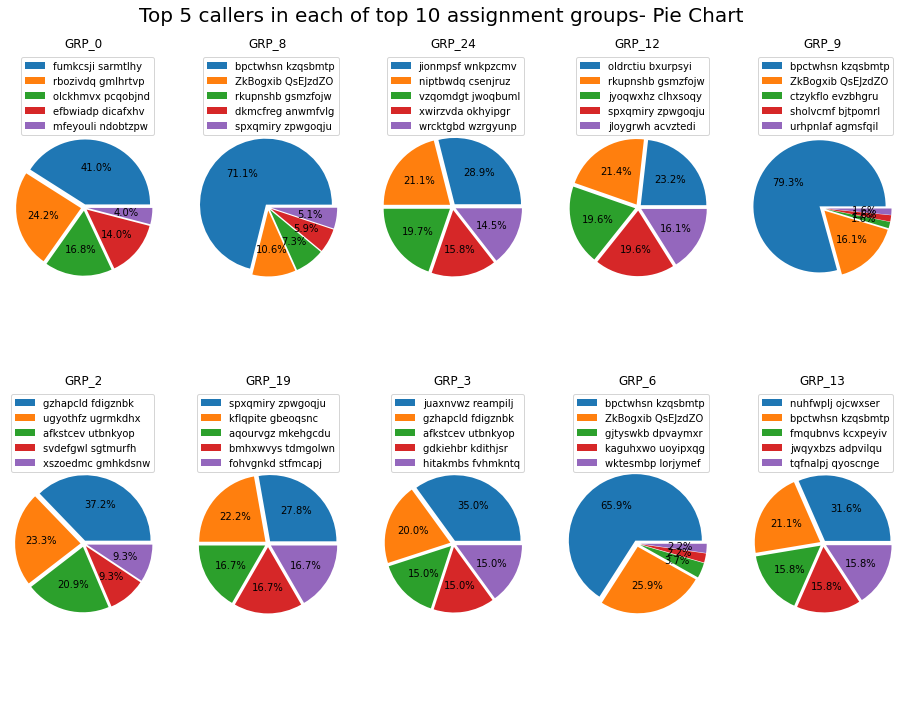

In [123]:
# Visualize Top 5 callers in each of top 10 assignment groups
top_n = 10 
top_grps = assgn_grp.nlargest(top_n, 'Count')['Assignment group'].tolist()

fig_cols = 5
fig_rows = int(np.ceil(top_n/fig_cols))
fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(13,9.5))
fig.suptitle('Top 5 callers in each of top 10 assignment groups- Pie Chart', y=1, va= 'bottom', size='20')
for row in range(fig_rows):
    for col in range(fig_cols):
        grp_n = fig_cols * row + col
        if grp_n < top_n:
            xs = caller_grp.xs(top_grps[grp_n])
            _ = axes[row,col].pie(xs, autopct='%1.1f%%', explode=[0.05]*5)
            axes[row,col].legend(labels=xs.index,loc="best")
            axes[row,col].axis('equal')
            axes[row,col].set_title(top_grps[grp_n])

plt.tight_layout()

In [124]:
# Check if any caller appears to raise ticket for multiple groups
mul_caller = caller_grp[caller_grp.Caller.duplicated()]
uni_mul_caller = [idx[1] for idx in mul_caller.index[mul_caller.Caller.unique()]]
print(f'\033[1mFollowing {len(uni_mul_caller)} callers happen to raise tickets for multiple groups:\033[0m\n')
print(uni_mul_caller)

mul_caller

Following 16 callers happen to raise tickets for multiple groups:

['hlrmufzx qcdzierm', 'fbgetczn jlsvxura', 'gnasmtvx cwxtsvkm', 'ihfkwzjd erbxoyqk', 'tqfnalpj qyoscnge', 'fmqubnvs kcxpeyiv', 'tghrloks jbgcvlmf', 'jwqyxbzs adpvilqu', 'nuhfwplj ojcwxser', 'oldrctiu bxurpsyi', 'vlymsnej whlqxcst', 'dkmcfreg anwmfvlg', 'bpctwhsn kzqsbmtp', 'lmsxcvoz vzhkdpfn', 'spxqmiry zpwgoqju', 'obanjrhg rnafleys']


Caller
Assignment group Caller                   
GRP_1            spxqmiry zpwgoqju       3
GRP_10           ihfkwzjd erbxoyqk       6
                 gnasmtvx cwxtsvkm       3
                 hlrmufzx qcdzierm       3
GRP_11           tghrloks jbgcvlmf       2
...                                    ...
GRP_72           ydigzqbu xdgjizek       1
GRP_8            ZkBogxib QsEJzdZO      54
GRP_9            ctzykflo evzbhgru       3
                 sholvcmf bjtpomrl       3
                 urhpnlaf agmsfqil       3

[273 rows x 1 columns]

**Observations**

*   There are overall 2950 callers in the dataset.
*   15 callers are involved in raising tickets for multiple assignment group, overall contributing to 281 tickets in the dataset.
*   The top 5 caller ticket distribution in every group is widely distributed almost having a balanced distribution. This indicated that most of the group resolves issues widely over various field impacting business

# **Data Pre-Processing**

### **N-Grams**

**Uni-Gram**

In [125]:
def get_top_n_words(corpus, range=(1,1), n=None):
    vec = CountVectorizer(ngram_range=range, stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]


common_words = get_top_n_words(ticket_df['cleaned_description'], (1,1),20)
for word, freq in common_words:
    print(word, freq)

password 1176
erp 1052
job 1016
issue 957
scheduler 955
tool 933
unable 868
failed 863
reset 855
user 808
monitoringtooljob 772
access 677
error 673
account 660
need 658
working 607
company 602
help 558
email 548
ticket 528


**Bi-Grams**

In [126]:
# The distribution of top bigrams after removing stop words for Complete_Description

common_words = get_top_n_words(ticket_df['cleaned_description'], (2,2),20)
for word, freq in common_words:
    print(word, freq)

failed scheduler 796
scheduler monitoringtooljob 768
job failed 734
password reset 351
reset password 241
engineering tool 212
management tool 209
account locked 208
collaboration platform 181
microsoft internet 166
password management 165
job scheduler 159
internet explorer 156
error message 156
scheduler monitoringtool 155
ticket update 153
abended job 151
phone email 147
specify cert 143
scheduled maintenance 143


**Tri-Grams**

In [127]:
# The distribution of top trigrams after removing stop words for Complete_Description

common_words = get_top_n_words(ticket_df['cleaned_description'], (3,3) ,20)
for word, freq in common_words:
    print(word, freq)

failed scheduler monitoringtooljob 768
job failed scheduler 733
password management tool 159
abended job scheduler 151
contact notified phone 143
notified phone email 143
remote dial equipment 143
dial equipment reset 143
equipment reset verified 143
reset verified working 143
verified working vendor 142
working vendor verizon 142
gsc started additional 142
started additional diagnostics 142
start scheduled maintenance 141
provider maint ticket 141
phone email remote 141
email remote dial 141
verizon gsc started 141
acti contact notified 140


### **Feature Extraction**

**Calculating TF-IDF**

In [128]:
# Total no. of unique words in "tokenized_desc" column
len(Counter(" ".join(ticket_df['tokenized_desc'].str.lower().values.tolist()).split(" ")).items())

12270

In [129]:
tfidf = TfidfVectorizer(max_features=12270, analyzer = 'word', min_df=2, max_df=0.95, ngram_range=(1, 2))
tckt_tfidf = tfidf.fit_transform(ticket_df['tokenized_desc'])

In [130]:
len(tckt_tfidf.todense())


8432

In [131]:
#  create a dictionary mapping the tokens to their tfidf values
tfidf = dict(zip(tfidf.get_feature_names(), tfidf.idf_))
tfidf = pd.DataFrame(columns=['tfidf']).from_dict(dict(tfidf), orient='index')
tfidf.columns = ['tfidf']

In [132]:
tfidf.sort_values(by=['tfidf'], ascending=True).head(10)

,tfidf
erp,3.080509
password,3.085269
job,3.120224
scheduler,3.177150
issue,3.207954
tool,3.226463
unable,3.272565
failed,3.278335
reset,3.288806
failed scheduler,3.359053


In [133]:
tfidf.sort_values(by=['tfidf'], ascending=False).head(20)

,tfidf
list attached,8.941296
srinfhyathbrowser microsoft,8.941296
germany site,8.941296
germany registergerirtcht,8.941296
germany plant,8.941296
germany pbx,8.941296
germany office,8.941296
germany new,8.941296
germany log,8.941296
srv microsoft,8.941296


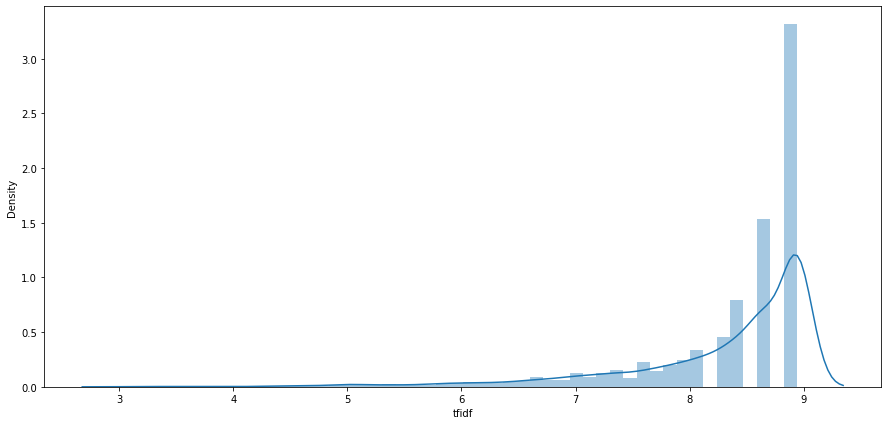

In [134]:
plt.figure(figsize=(15,7))
sns.distplot(tfidf["tfidf"])

**Observations**

*   Low TF-IDF - Words that have low significance in the dataset - Erp, job, passwords, jobscheduler, failed etc.
*   High TF-IDF - Words that have high significance in the dataset - outside accessgroup, dst outside, src inside, src, accessgroup etc. 
*   TF-IDF distribution curve suggest that it has more dimensions to it. Thus it would be apt to apply some dimensionality reduction techniques like LDA.





**Perform LDA - Dimensionality Reduction**

In [135]:
# create count vectorizer first
cvectorizer = CountVectorizer(min_df=4, max_features=637, ngram_range=(1,2))
cvz = cvectorizer.fit_transform(ticket_df['tokenized_desc'])

# generate topic models using Latent Dirichlet Allocation
lda_model = LatentDirichletAllocation(n_components=10, learning_method='online', max_iter=20, random_state=42)
X_topics = lda_model.fit_transform(cvz)

In [136]:
n_top_words = 10
topic_summaries = []

# get topics and topic terms
topic_word = lda_model.components_ 
vocab = cvectorizer.get_feature_names()

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' | '.join(topic_words)))

Topic 0: password | reset | password reset | erp | microsoft | skype | internet | microsoft internet | explorer | request
Topic 1: job | scheduler | failed | failed scheduler | monitoringtooljob | scheduler monitoringtooljob | job failed | monitoringtool | job scheduler | abended
Topic 2: password | update | tool | management | ticket | management tool | manager | using | password management | reset
Topic 3: need | issue | message | help | access | system | erp | new | error | printer
Topic 4: pc | mit | nicht | laptop | bitte | germany | für | probleme | und | der
Topic 5: et | since | company | acti | start | na | power | contact | outage | backup
Topic 6: call | work | time | screen | connection | user | know | event | software | let
Topic 7: outlook | user | issue | access | id | unable | open | email | crm | working
Topic 8: tool | server | problem | error | engineering | see | engineering tool | erp | log | attached
Topic 9: account | unable | locked | erp | account locked | unlo

**Observations**

*   We can see that password related tickets are classified as - topic 5, account related tickets in - topic 2 , job scheduler related tickets in - topic 9 etc.
*   Thus each topic revolves around a specific ticket issue.

**Tranforming tokens to vector using TF-IDF**

In [137]:
# collect the tfid matrix in numpy array
array = tckt_tfidf.todense()

# store the tf-idf array into pandas dataframe
df_tfidf = pd.DataFrame(array)
df_tfidf.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12230,12231,12232,12233,12234,12235,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.124129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [138]:
#Check for equality in no of rows before and presence of null values before copying word count columns into TF-IDF vectorized dataframe
print(ticket_df[ticket_df.isnull().values == True])
print(ticket_df.shape)
print(df_tfidf.shape)

Empty DataFrame
Columns: [Short description, Description, Caller, Assignment group, language, cleaned_description, descr_len, num_wds, avg_word, uniq_wds, tokenized_desc]
Index: []
(8432, 11)
(8432, 12270)


In [139]:
df_tfidf['descr_len']= ticket_df['descr_len'].values
df_tfidf['num_wds']= ticket_df['num_wds'].values
df_tfidf['avg_word']= ticket_df['avg_word'].values
df_tfidf['uniq_wds']= ticket_df['uniq_wds'].values
df_tfidf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12234,12235,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269,descr_len,num_wds,avg_word,uniq_wds
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.124129,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,125,18,6.000000,18
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,75,11,5.909091,11
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14,3,4.000000,3
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26,5,4.400000,5
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11,2,5.000000,2


In [140]:
# Apply Z-score to normalize the values
df_tfidf_z = df_tfidf.apply(zscore)  # convert all attributes to Z scale 
df_tfidf_z.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12234,12235,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269,descr_len,num_wds,avg_word,uniq_wds
0,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,3.517013,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,0.276837,0.317553,-0.240602,0.332661
1,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.089113,-0.068373,-0.308770,-0.062990
2,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.535572,-0.509431,-1.740291,-0.515163
3,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.447744,-0.399166,-1.440353,-0.402120
4,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.021758,-0.021758,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.01

In [141]:
df_tfidf_z['Assignment_group']= ticket_df['Assignment group'].values
df_tfidf_z[df_tfidf_z.isnull().values == True]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12235,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269,descr_len,num_wds,avg_word,uniq_wds,Assignment_group


**Save the cleansed vectorized and non vectorized dataset into a csv file for future modelling purpose**

In [142]:
df_tfidf_z.to_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/tfidf_ticket_df.csv', index=False, encoding='utf_8_sig')
ticket_df.to_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_ticket_df.csv', index=False, encoding='utf_8_sig')

### **Label Encoding / One Hot Encoding**

In [86]:
ticket_df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/cleaned_ticket_df.csv',encoding='utf-8')
df_tfidf_z = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Capstone_Project_AIML/tfidf_ticket_df.csv',encoding='utf-8')

**Label Encoding**

In [87]:
#Label encoding vectorized dataframe
le1 = preprocessing.LabelEncoder()
df_tfidf_z['Assignment_group'] = df_tfidf_z['Assignment_group'].astype(str)
df_tfidf_z["LabelEncodings"] = le1.fit_transform(df_tfidf_z['Assignment_group'])
y_classes_len = len(le1.classes_)
le1.classes_
print("No. of unique target group", y_classes_len)
df_tfidf_z.head()

No. of unique target group 68


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,12236,12237,12238,12239,12240,12241,12242,12243,12244,12245,12246,12247,12248,12249,12250,12251,12252,12253,12254,12255,12256,12257,12258,12259,12260,12261,12262,12263,12264,12265,12266,12267,12268,12269,descr_len,num_wds,avg_word,uniq_wds,Assignment_group,LabelEncodings
0,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,3.517013,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,0.276837,0.317553,-0.240602,0.332661,GRP_0,0
1,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.089113,-0.068373,-0.308770,-0.062990,GRP_0,0
2,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.535572,-0.509431,-1.740291,-0.515163,GRP_0,0
3,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.01883,-0.01883,-0.015293,-0.01883,-0.01883,-0.033862,-0.015339,-0.015403,-0.015403,-0.015403,-0.021758,-0.026338,-0.015403,-0.025995,-0.018812,-0.01883,-0.01883,-0.01883,-0.01883,-0.021591,-0.01533,-0.015361,-0.021758,-0.021758,-0.447744,-0.399166,-1.440353,-0.402120,GRP_0,0
4,-0.025421,-0.026586,-0.018833,-0.015403,-0.015244,-0.017794,-0.015398,-0.028546,-0.026633,-0.134593,-0.133797,-0.035485,-0.014615,-0.021332,-0.028877,-0.018748,-0.015375,-0.015375,-0.199857,-0.052115,-0.031898,-0.015403,-0.014269,-0.015355,-0.038902,-0.024306,-0.020258,-0.020395,-0.029478,-0.014974,-0.01388,-0.015373,-0.06417,-0.015273,-0.0399,-0.060723,-0.015301,-0.015352,-0.040026,-0.014754,...,-0.015244,-0.015388,-0.021758,-0.021758,-0.015403,-0.015403,-0.01883,-0.015403,-0.01883,-0.01883,-0.018

In [88]:
#Label encoding non-vectorized dataframe
le = preprocessing.LabelEncoder()
ticket_df['Assignment group'] = ticket_df['Assignment group'].astype(str)
ticket_df["LabelEncodings"] = le.fit_transform(ticket_df['Assignment group'])
y_classes_len = len(le.classes_)
le.classes_
print("No. of unique target group", y_classes_len)
ticket_df.head()

No. of unique target group 68


,Short description,Description,Caller,Assignment group,language,cleaned_description,descr_len,num_wds,avg_word,uniq_wds,tokenized_desc,LabelEncodings
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,en,login issue verified user detail employee mana...,125,18,6.000000,18,login issue verified user detail employee mana...,0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,en,outlook team meeting skype etc appearing calen...,75,11,5.909091,11,outlook team meeting skype etc appearing calen...,0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,en,cannot log vpn,14,3,4.000000,3,cannot log vpn,0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,en,unable access hr tool page,26,5,4.400000,5,unable access hr tool page,0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,no,skype error,11,2,5.000000,2,skype error,0


# **Modelling**

List of Machine Learning models to try out:

**Statistical ML Models**
*   Multinomial Logistic Regression
*   Support Vector Machine
*   Stochastic Gradient Descent
*   Multinomial Naive Bayes
*   K Nearest neighbor
*   Random Forest
*   Decision trees
*   Xgboost



**Neural Network Models**
*   Deep Neural Network
*   Convolutional Neural Network
*   Recurrent Neural Network
*   Recurrent Convolutional Neural Network
*   LSTM

## **Creating Model with complete imbalance dataset**

## **Statistical ML Models**

In [89]:
bottom_20 = ticket_df['LabelEncodings'].value_counts().nsmallest(20).reset_index()
bottom_20

,index,LabelEncodings
0,56,1
1,64,2
2,49,2
3,65,2
4,52,2
5,62,2
6,51,3
7,31,3
8,58,3
9,61,3


In [90]:
bottom_20 = df_tfidf_z['LabelEncodings'].value_counts().nsmallest(20).reset_index()
bottom_20

,index,LabelEncodings
0,56,1
1,64,2
2,49,2
3,65,2
4,52,2
5,62,2
6,51,3
7,31,3
8,58,3
9,61,3


In [91]:
# Remove label encoded target group with one ticket each
ticket_df.drop(ticket_df[(ticket_df['LabelEncodings'] == 56)].index , inplace=True)
df_tfidf_z.drop(df_tfidf_z[(df_tfidf_z['LabelEncodings'] == 56)].index , inplace=True)

In [92]:
#Store the accuracy results for each model in a dataframe for final comparison
df_resLog = pd.DataFrame()
n_classes = len(ticket_df["LabelEncodings"].unique())
print(n_classes)

67


In [93]:
from sklearn.metrics import precision_recall_curve
# A class that logs the time
class Timer():
    '''
    A generic class to log the time
    '''
    def __init__(self):
        self.start_ts = None
    def start(self):
        self.start_ts = time()
    def stop(self):
        return 'Time taken: %2fs' % (time()-self.start_ts)
    
timer = Timer()

# A method to train and test the model
def run_classification(model_name, estimator, X_train, X_test, y_train, y_test, arch_name=None, pipelineRequired=True, isDeepModel=False):
    timer.start()
    # train the model
    clf = estimator

    if pipelineRequired :
        clf = Pipeline([('vect', CountVectorizer()),
                     ('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=10, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the classifier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        print("start")
        clf.fit(X_train, y_train)
        # predict from the claffier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
        y_pred_prob = clf.predict_proba(X_test)
    
    print('Estimator:', clf)
    print('='*80)
    train_acc = accuracy_score(y_train,y_train_pred)
    print('Training accuracy: ', (train_acc))
    test_acc = accuracy_score(y_test, y_pred)
    print('Testing accuracy: ', (test_acc))
    print('='*80)
    print('Confusion matrix:\n ', (confusion_matrix(y_test, y_pred)))
    print('='*80)
    print('Classification report:\n ', (classification_report(y_test, y_pred)))
    f1 = f1_score(y_pred, y_test, average='weighted', labels=np.unique(y_pred))
    print("F1 score: ",f1)
    print(timer.stop(), 'to run the model')

    # ROC curve
    fpr = dict()
    tpr = dict()
    thresh = dict()
    for i in range(n_classes):
      fpr[i], tpr[i], thresh[i] = roc_curve(y_test.ravel(), y_pred_prob[:,i], pos_label=i)

    # plotting   
    plt.figure(figsize=(20,6))
    plt.subplot(1, 2, 1) 
    plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0')
    plt.plot(fpr[66], tpr[66], linestyle='--',color='green', label='Class 66')
    plt.plot(fpr[17], tpr[17], linestyle='--',color='blue', label='Class 17')
    plt.plot(fpr[4], tpr[4], linestyle='--',color='yellow', label='Class 4')
    plt.plot([0, 1], [0, 1], linestyle='--', color='red', label='ideal')
    plt.title('Multiclass ROC curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive rate')
    plt.legend(loc='best')

    # Precision Recall curve
    precision = dict()
    recall = dict()
    thres = dict()
    for i in range(n_classes):
      precision[i], recall[i], thres[i] = precision_recall_curve(y_test.ravel(), y_pred_prob[:,i], pos_label=i)

    # plotting   
    plt.subplot(1, 2, 2) 
    plt.plot(recall[0], precision[0], linestyle='--',color='orange', label='Class 0')
    plt.plot(recall[66], precision[66], linestyle='--',color='green', label='Class 66')
    plt.plot(recall[17], precision[17], linestyle='--',color='blue', label='Class 17')
    plt.plot(recall[4], precision[4],color='yellow', label='Class 4')
    plt.title('Multiclass Precision Recall curve')
    plt.xlabel('recall')
    plt.ylabel('precision')
    plt.legend(loc='best')

    t = re.findall('\d*\.?\d+',(timer.stop()))
    df_results = pd.DataFrame()
    df_tempResults = pd.DataFrame({'Model':[model_name], 'Train Accuracy': [train_acc], 'Test Accuracy': [test_acc], 'F1 Score': [f1],  'Time Taken (sec)': [t[0]]})
    df_results = pd.concat([df_results, df_tempResults])
    return df_results

In [94]:
# Unvectorized cleansed data
X = ticket_df.tokenized_desc
Y = ticket_df["LabelEncodings"]
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    Y	, 
                                                    test_size=0.20, 
                                                    random_state=42, stratify = ticket_df["LabelEncodings"])
print('Shape of the training set:', X_train.shape, X_test.shape)
print('Shape of the test set:', y_train.shape, y_test.shape)

Shape of the training set: (6744,) (1687,)
Shape of the test set: (6744,) (1687,)


In [95]:
# Vectorized dataframe without word count features
X_v = df_tfidf_z.iloc[:,:-6]
Y_v = df_tfidf_z['LabelEncodings']
input = 'One-hot encoded target with no. words, avg number, len, unique word no'
X_train_v, X_test_v, y_train_v, y_test_v = train_test_split(X_v, 
                                                    Y_v, 
                                                    test_size=0.20, 
                                                    random_state=42)
print('Shape of the training set:', X_train_v.shape, X_test_v.shape)
print('Shape of the test set:', y_train_v.shape, y_test_v.shape)

Shape of the training set: (6744, 12270) (1687, 12270)
Shape of the test set: (6744,) (1687,)


In [96]:
# Vectorized dataframe with word count features
X_vf = df_tfidf_z.iloc[:,:-2]
Y_vf = df_tfidf_z['LabelEncodings']
input = 'One-hot encoded target with no. words, avg number, len, unique word no'
X_train_vf, X_test_vf, y_train_vf, y_test_vf = train_test_split(X_vf, 
                                                    Y_vf, 
                                                    test_size=0.20, 
                                                    random_state=42)
print('Shape of the training set:', X_train_vf.shape, X_test_vf.shape)
print('Shape of the test set:', y_train_vf.shape, y_test_vf.shape)

Shape of the training set: (6744, 12274) (1687, 12274)
Shape of the test set: (6744,) (1687,)


In [97]:
# No of unique targets present in the train and test set 
Ytrain = pd.DataFrame()
Ytrain['Assignment group'] = le.inverse_transform(y_train)
Ytest = pd.DataFrame()
Ytest['Assignment group'] = le.inverse_transform(y_test)

train_test_df = pd.DataFrame()
train_test_df['Unique Targets'] = [len(Ytrain['Assignment group'].unique()), len(Ytest['Assignment group'].unique())]
train_test_df.index = ['Train', 'Test']
train_test_df.transpose()

,Train,Test
Unique Targets,67,62


The no. of unique targets in train is not the same with test due to high imbalance in the data, having as low as 2 tickets in few groups before splitting.

In [98]:
# Train set target distribution
configure_plotly_browser_state()
Ytrain['Assignment group'].iplot(kind='hist', xTitle='Assignment Group', yTitle='count', colorscale='-orrd', title='Records by rare Assignment Groups- Histogram')

plt.show()

In [99]:
# Test set target distribution
configure_plotly_browser_state()
Ytest['Assignment group'].iplot(kind='hist', xTitle='Assignment Group', yTitle='count', colorscale='-orrd', title='Records by rare Assignment Groups- Histogram')

plt.show()

### **Multinomial Logistic Regression**

In [100]:
df_LR_Results = pd.DataFrame(columns=['Model','Train Accuracy','Test Accuracy','F1 Score','Time Taken (sec)'])

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=Non...
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, interce

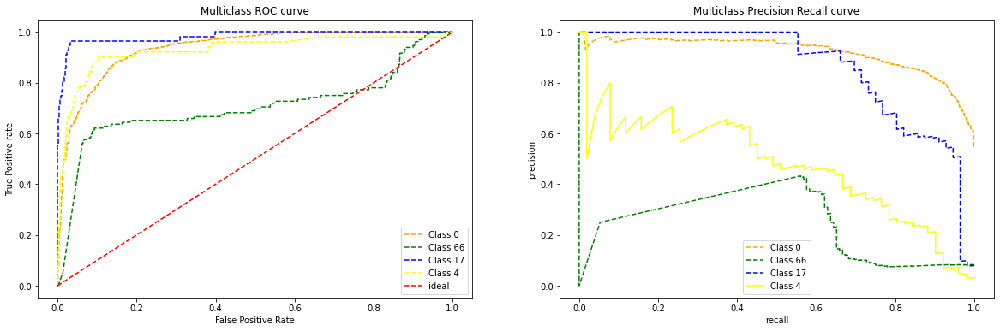

In [101]:
model_name = 'Multinomial Logistic Regression'
df_temp = run_classification(model_name, LogisticRegression(multi_class='multinomial', solver='lbfgs'), X_train, X_test, y_train, y_test)
df_LR_Results = pd.concat([df_LR_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=Non...
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                                    fit_intercept=True, i

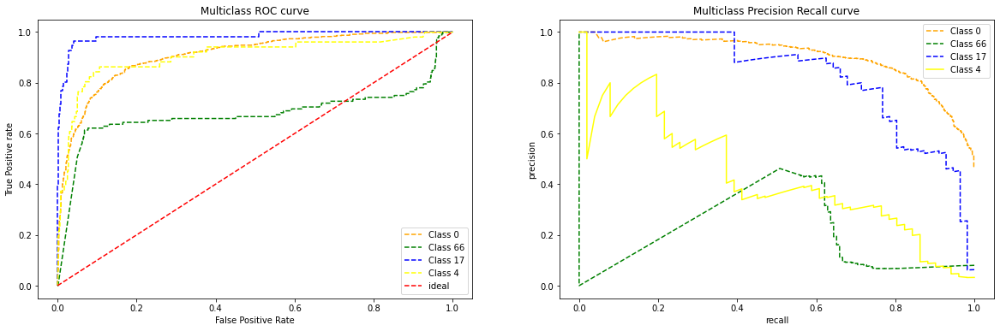

In [103]:
model_name = 'Multinomial Logistic Regression with b-weights'
df_temp = run_classification(model_name, LogisticRegression(multi_class='multinomial', solver='lbfgs',class_weight='balanced'), X_train, X_test, y_train, y_test)
df_LR_Results = pd.concat([df_LR_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy:  0.9297153024911032
Testing accuracy:  0.6419679905157084
Confusion matrix:
  [[660   0   3 ...   6   1   1]
 [  0   0   0 ...   0   2   0]
 [  2   0  10 ...   0  12   0]
 ...
 [  4   0   0 ...   8   0   0]
 [  1   0   0 ...   0 134   2]
 [  0   0   1 ...   0  27   8]]
Classification report:
                precision    recall  f1-score   support

           0       0.82      0.82      0.82       803
           1       0.00      0.00      0.00         3
           2       0.48      0.32      0.38        31
           3       0.00      0.00      0.00         9
           4       0.48      0.51      0.49        39
           

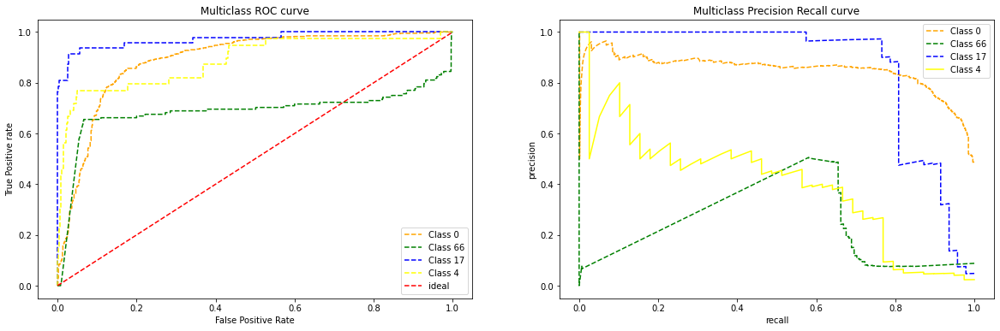

In [105]:
model_name = 'Multinomial Logistic Regression without word count features'
df_temp = run_classification(model_name, LogisticRegression(multi_class='multinomial', solver='lbfgs'), X_train_v, X_test_v, y_train_v, y_test_v, arch_name= None, pipelineRequired=False)
df_LR_Results = pd.concat([df_LR_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Training accuracy:  0.9292704626334519
Testing accuracy:  0.6461173681090694
Confusion matrix:
  [[667   0   3 ...   6   1   1]
 [  0   0   0 ...   0   2   0]
 [  2   0  12 ...   0  12   0]
 ...
 [  4   0   0 ...   8   0   0]
 [  1   0   0 ...   0 135   2]
 [  0   0   1 ...   0  27   8]]
Classification report:
                precision    recall  f1-score   support

           0       0.82      0.83      0.83       803
           1       0.00      0.00      0.00         3
           2       0.52      0.39      0.44        31
           3       0.00      0.00      0.00         9
           4       0.50      0.51      0.51        39
           

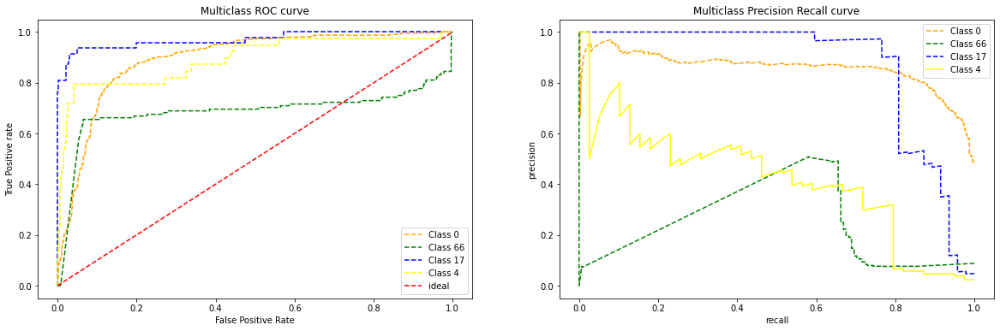

In [107]:
model_name = 'Multinomial Logistic Regression with word count features'
df_temp = run_classification(model_name, LogisticRegression(multi_class='multinomial', solver='lbfgs'), X_train_vf, X_test_vf, y_train_vf, y_test_vf, arch_name= None, pipelineRequired=False)
df_LR_Results = pd.concat([df_LR_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

In [109]:
df_LR_Results.sort_values(by='Test Accuracy', ascending = False)

,Model,Train Accuracy,Test Accuracy,F1 Score,Time Taken (sec)
0,Multinomial Logistic Regression with word coun...,0.929270,0.646117,0.660112,119.157214
0,Multinomial Logistic Regression without word c...,0.929715,0.641968,0.654509,114.525980
0,Multinomial Logistic Regression,0.663553,0.621814,0.722842,18.808882
0,Multinomial Logistic Regression with b-weights,0.502966,0.378779,0.342945,11.690096


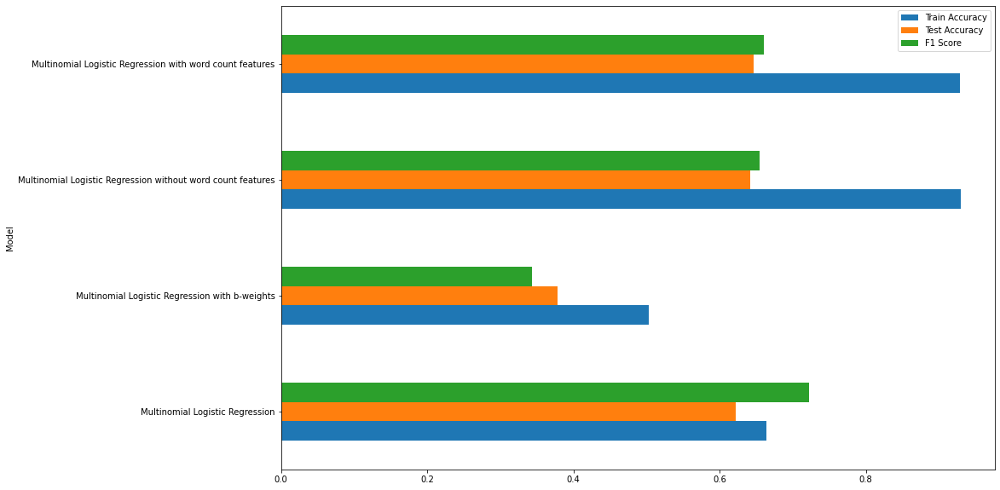

In [110]:
df_LR_Results.plot(kind='barh',x='Model', figsize=[15,10])

### **Support Vector Machine**

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=None)),
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None,
                     coef0=0.0, decision_function_shape

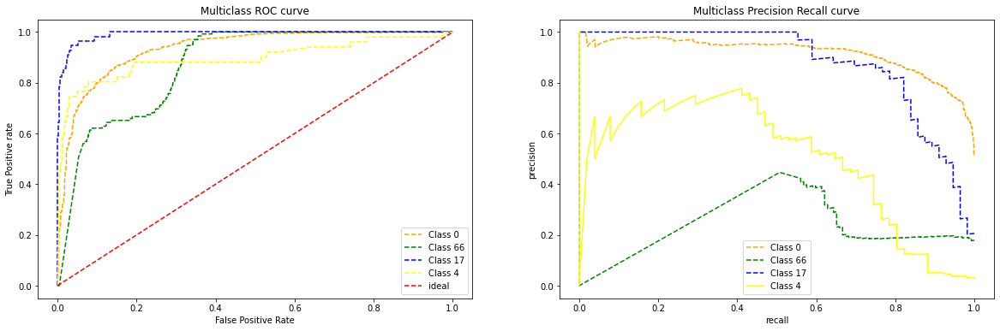

In [111]:
model_name = 'SVM-RBF Kernal'
df_temp = run_classification(model_name, SVC(kernel='rbf', probability = True), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=None)),
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 SVC(C=1.0, break_ties=False, cache_size=200,
                     class_weight='balanced', coef0=0.0,
                 

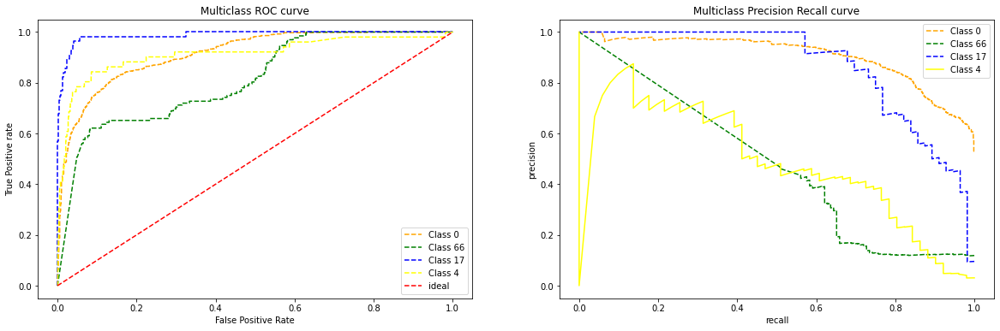

In [114]:
model_name = 'SVM-RBF Kernal with b-weights'
df_temp = run_classification(model_name, SVC(kernel='rbf', probability = True, class_weight='balanced'), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

### **Stochastic Gradient Descent**

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=Non...
                 SGDClassifier(alpha=0.001, average=False, class_weight=None,
                               early_stopping=False, epsilon=0.1, eta0=0.0,
                               fit_intercept=True, l1_ratio=0.15,
                               learning_rate='optimal', loss='modified_huber',
                    

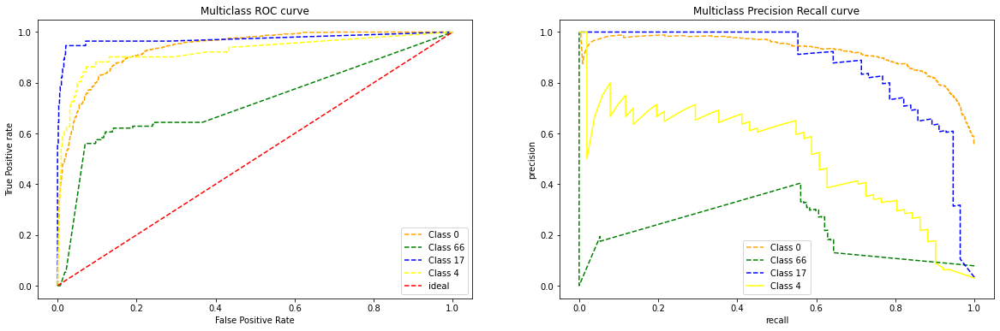

In [116]:
model_name = 'Stochastic Gradient Descent'
df_temp = run_classification(model_name, SGDClassifier(loss='modified_huber', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None), X_train, X_test, y_train, y_test)
# df_SGD_Results = pd.concat([df_SGD_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=Non...
                 SGDClassifier(alpha=0.001, average=False,
                               class_weight='balanced', early_stopping=False,
                               epsilon=0.1, eta0=0.0, fit_intercept=True,
                               l1_ratio=0.15, learning_rate='optimal',
                               loss='

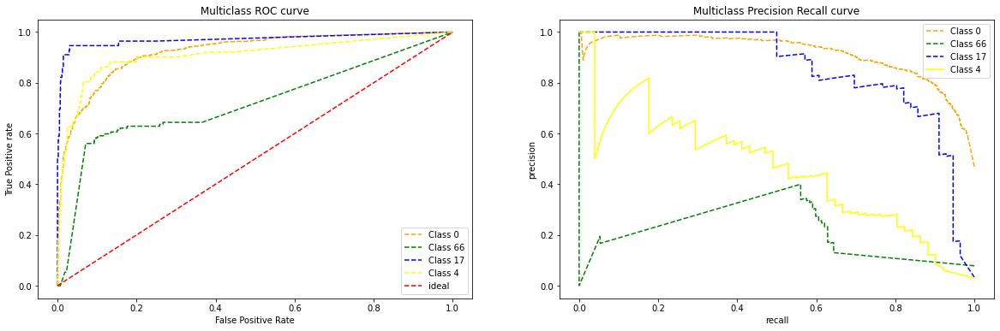

In [118]:
model_name = 'Stochastic Gradient Descent with b-weights'
df_temp = run_classification(model_name, SGDClassifier(loss='modified_huber', penalty='l2',alpha=1e-3, random_state=42, max_iter=100, tol=None,class_weight='balanced'), X_train, X_test, y_train, y_test)
# df_SGD_Results = pd.concat([df_SGD_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

### **Multinomial Naive Bayes**

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=None)),
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))],
         verbose=False)
Training accuracy:  0.56820877817

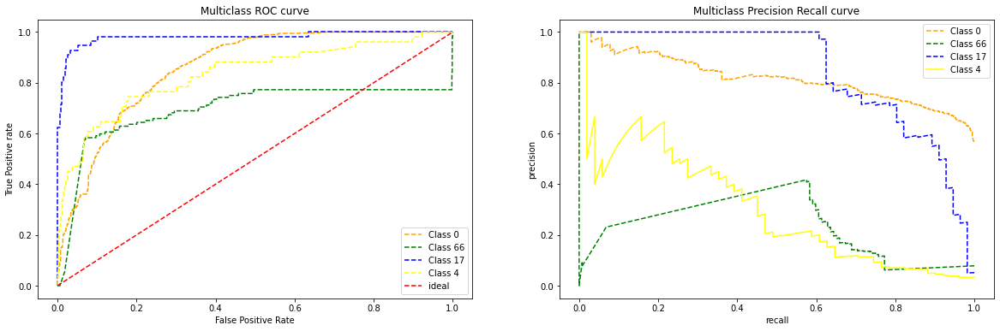

In [120]:
model_name = 'Multinomial Naive Bayes'
df_temp = run_classification(model_name, MultinomialNB(), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]  =df_temp

### **K Nearest neighbor**

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=None)),
                ('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                      metric='minkowski', metric_p

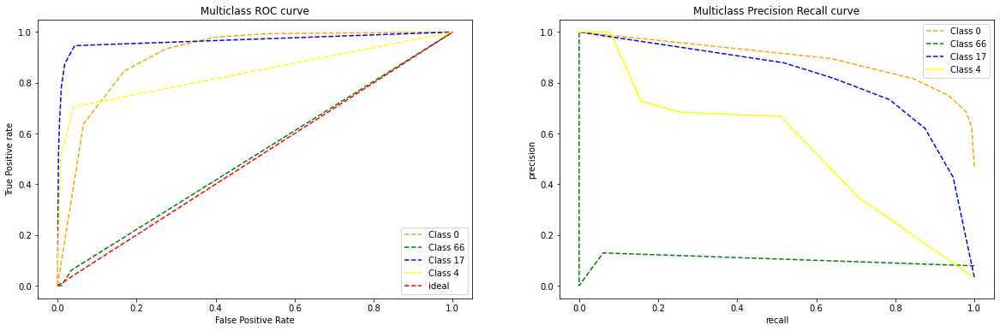

In [124]:
model_name = 'K Nearest neighbor'
df_temp = run_classification(model_name, KNeighborsClassifier(), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)]=df_temp

## **Random Forest**

In [126]:
df_RF_Results = pd.DataFrame(columns=['Model','Train Accuracy','Test Accuracy','F1 Score','Time Taken (sec)'])

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=Non...
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=None, max_features='auto',
                                        max_leaf_nodes=None, max_samples=None,
               

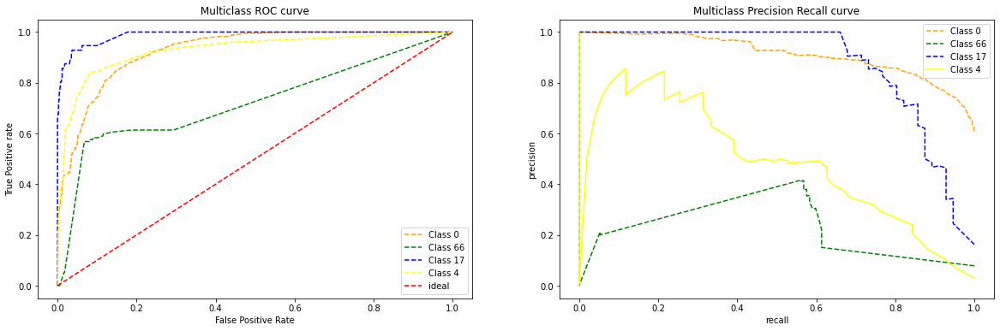

In [127]:
model_name = 'Random Forest'
df_temp = run_classification(model_name, RandomForestClassifier(n_estimators=100), X_train, X_test, y_train, y_test)
df_RF_Results = pd.concat([df_RF_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=Non...
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight='balanced',
                                        criterion='gini', max_depth=None,
                                        max_features='auto',
                                        max_leaf

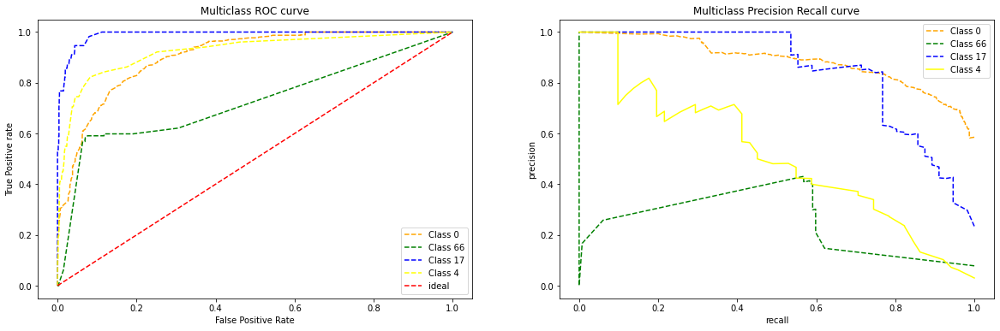

In [129]:
model_name = 'Random Forest with b-weights'
df_temp = run_classification(model_name, RandomForestClassifier(n_estimators=100, class_weight = 'balanced'), X_train, X_test, y_train, y_test)
df_RF_Results = pd.concat([df_RF_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Training accuracy:  0.9306049822064056
Testing accuracy:  0.6597510373443983
Confusion matrix:
  [[779   0   0 ...   2   0   0]
 [  0   0   0 ...   0   3   0]
 [ 16   0   1 ...   0  11   0]
 ...
 [  3   0   0 ...  10   0   0]
 [  5   0   0 ...   0 137   1]
 [  6   0   0 ...   0  28   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.69      0.97      0.80       803
           1 

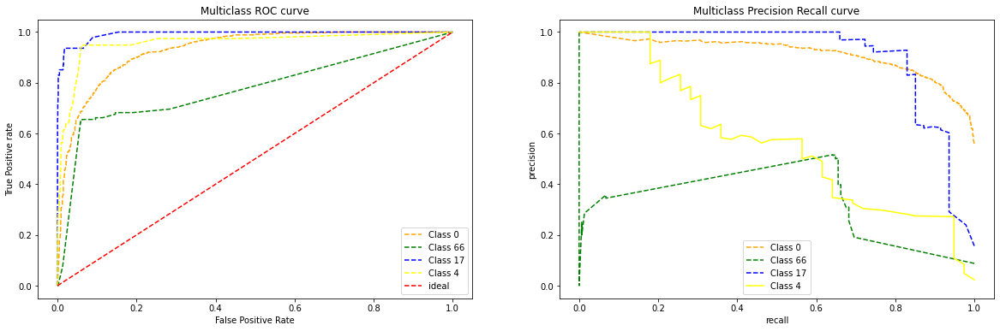

In [131]:
model_name = 'Random Forest without word count features'
df_temp = run_classification(model_name, RandomForestClassifier(n_estimators=100), X_train_v, X_test_v, y_train_v, y_test_v, arch_name= None, pipelineRequired=False)
df_RF_Results = pd.concat([df_RF_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Training accuracy:  0.9344602609727165
Testing accuracy:  0.6532305868405454
Confusion matrix:
  [[781   0   0 ...   3   0   0]
 [  0   0   0 ...   0   3   0]
 [ 17   0   1 ...   0  11   0]
 ...
 [  3   0   0 ...  10   0   0]
 [  5   0   0 ...   0 137   1]
 [  7   0   0 ...   0  28   3]]
Classification report:
                precision    recall  f1-score   support

           0       0.67      0.97      0.79       803
           1 

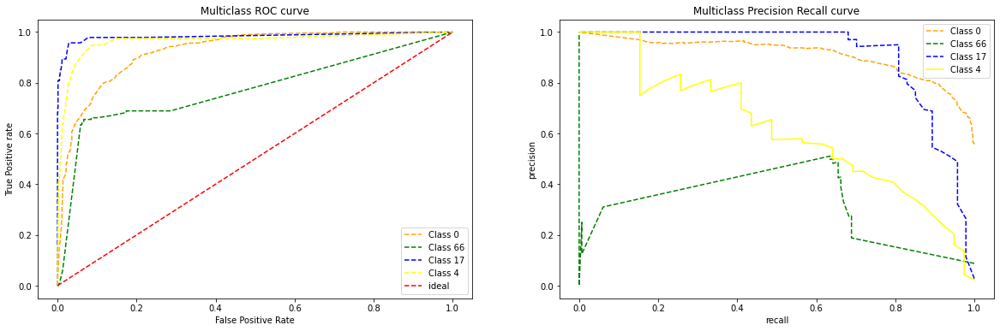

In [134]:
model_name = 'Random Forest with word count features'
df_temp = run_classification(model_name, RandomForestClassifier(n_estimators=100), X_train_vf, X_test_vf, y_train_vf, y_test_vf, arch_name= None, pipelineRequired=False)
df_RF_Results = pd.concat([df_RF_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

In [136]:
df_RF_Results.sort_values(by='Test Accuracy', ascending = False)

,Model,Train Accuracy,Test Accuracy,F1 Score,Time Taken (sec)
0,Random Forest without word count features,0.930605,0.659751,0.733062,38.483404
0,Random Forest with word count features,0.934460,0.653231,0.731611,34.940396
0,Random Forest,0.934905,0.650267,0.730503,10.093235
0,Random Forest with b-weights,0.891311,0.590990,0.651269,10.988256


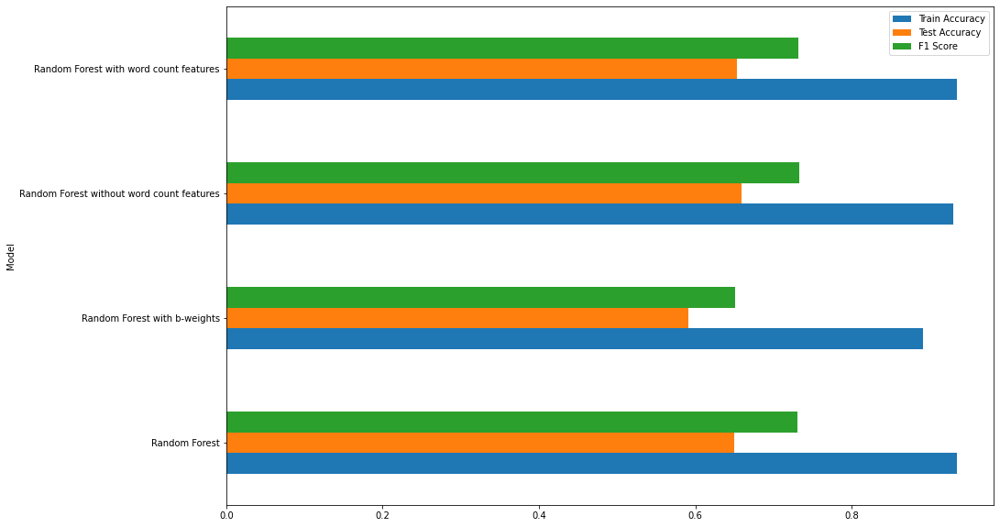

In [137]:
df_RF_Results.plot(kind='barh',x='Model', figsize=[15,10])

## **Decision trees**

In [138]:
df_DT_Results = pd.DataFrame(columns=['Model','Train Accuracy','Test Accuracy','F1 Score','Time Taken (sec)'])

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=Non...
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                        criterion='gini', max_depth=None,
                                        max_features=None, max_leaf_nodes=Non

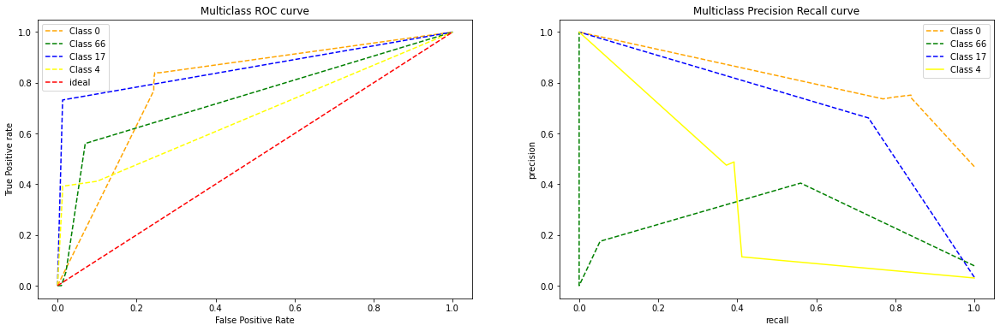

In [139]:
model_name = 'Decision trees'
df_temp = run_classification(model_name, DecisionTreeClassifier(), X_train, X_test, y_train, y_test)
df_DT_Results = pd.concat([df_DT_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=Non...
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced',
                                        criterion='gini', max_depth=None,
                                        max_features=None, max_leaf_nod

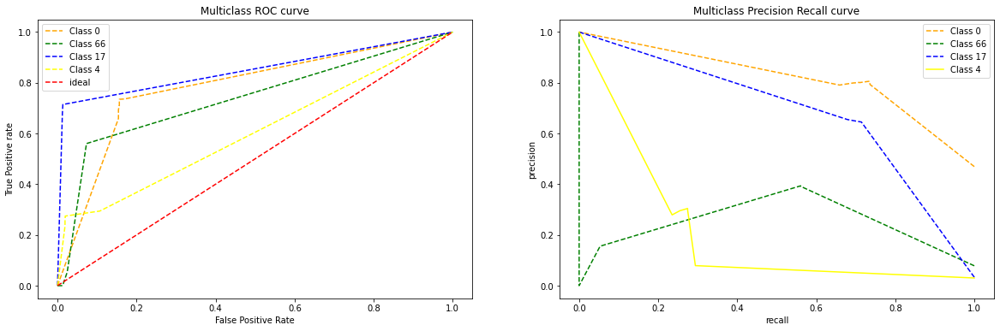

In [141]:
model_name = 'Decision trees with b-weights'
df_temp = run_classification(model_name, DecisionTreeClassifier(class_weight='balanced'), X_train, X_test, y_train, y_test)
df_DT_Results = pd.concat([df_DT_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
Training accuracy:  0.9307532621589562
Testing accuracy:  0.6206283343212804
Confusion matrix:
  [[685   0   0 ...   1   1   3]
 [  0   0   0 ...   0   3   0]
 [  6   0   4 ...   0  11   0]
 ...
 [  3   0   0 ...   9   0   0]
 [  3   0   0 ...   0 129   1]
 [  1   0   0 ...   0  28   6]]
Classification report:
                precision    recall  f1-score   support

           0       0.78      0.85      0.81       803
           1       0.00      0.00      0.00         3
           2       0.44      0.13      0.20        31
           3       0.00  

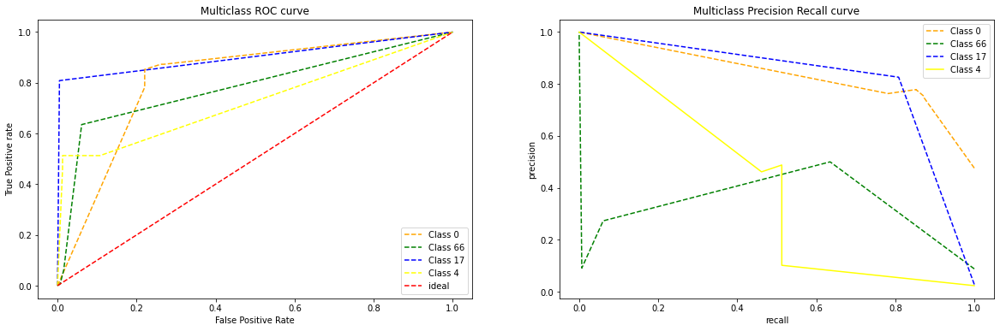

In [143]:
model_name = 'Decision trees without word count features'
df_temp = run_classification(model_name, DecisionTreeClassifier(), X_train_v, X_test_v, y_train_v, y_test_v, arch_name= None, pipelineRequired=False)
df_DT_Results = pd.concat([df_DT_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

start
Estimator: DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
Training accuracy:  0.9344602609727165
Testing accuracy:  0.5815056312981625
Confusion matrix:
  [[653   0   1 ...   3   0   3]
 [  0   0   0 ...   0   2   0]
 [  8   0   2 ...   0  11   0]
 ...
 [  1   0   0 ...  10   0   0]
 [  3   0   0 ...   0 128   1]
 [  3   0   0 ...   0  27   6]]
Classification report:
                precision    recall  f1-score   support

           0       0.74      0.81      0.78       803
           1       0.00      0.00      0.00         3
           2       0.18      0.06      0.10        31
           3       0.00  

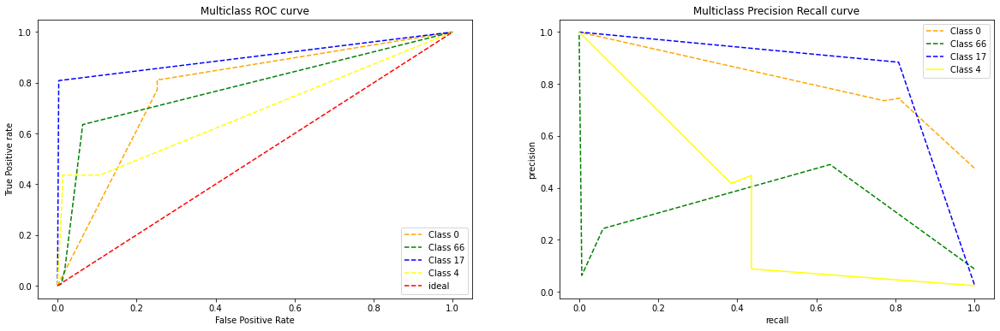

In [145]:
model_name = 'Decision trees with word count features'
df_temp = run_classification(model_name, DecisionTreeClassifier(), X_train_vf, X_test_vf, y_train_vf, y_test_vf, arch_name= None, pipelineRequired=False)
df_DT_Results = pd.concat([df_DT_Results, df_temp])
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

In [147]:
df_DT_Results.sort_values(by='Test Accuracy', ascending = False)

,Model,Train Accuracy,Test Accuracy,F1 Score,Time Taken (sec)
0,Decision trees without word count features,0.930753,0.620628,0.647037,12.503277
0,Decision trees,0.934905,0.590990,0.620734,1.742803
0,Decision trees with word count features,0.934460,0.581506,0.605929,7.063638
0,Decision trees with b-weights,0.882711,0.487255,0.467106,2.505630


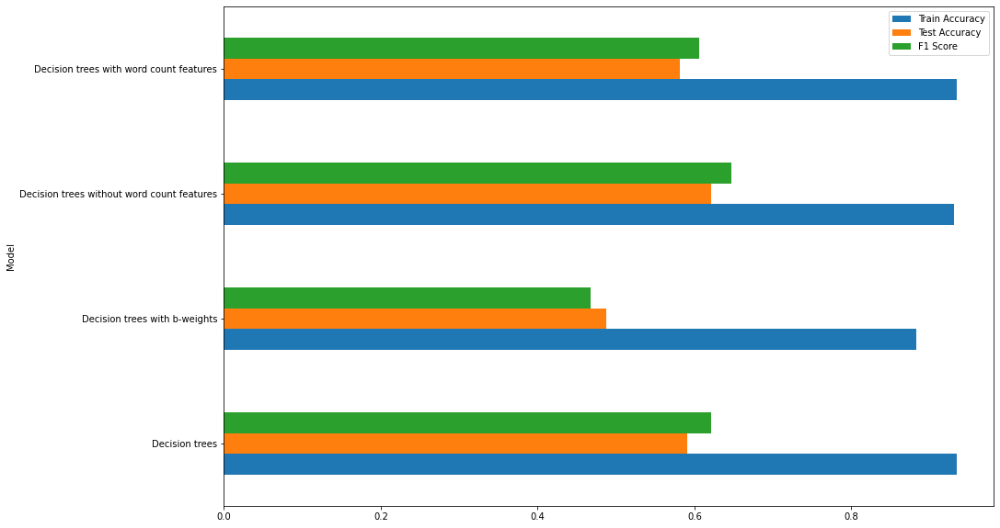

In [148]:
df_DT_Results.plot(kind='barh',x='Model', figsize=[15,10])

## **xgboost**

start
Estimator: Pipeline(memory=None,
         steps=[('vect',
                 CountVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.int64'>, encoding='utf-8',
                                 input='content', lowercase=True, max_df=1.0,
                                 max_features=None, min_df=1,
                                 ngram_range=(1, 1), preprocessor=None,
                                 stop_words=None, strip_accents=None,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, vocabulary=Non...
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=0.8, gamma=0, learning_rate=0.1,
                               max_delta_step=0, max_depth=7,
                               min_chil

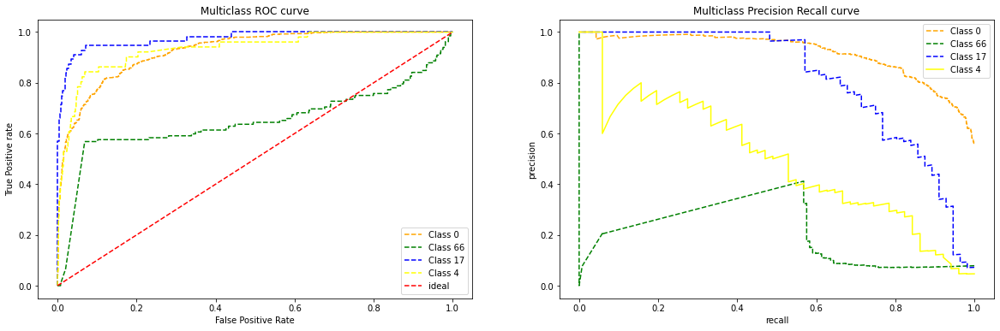

In [149]:
model_name = 'xgboost'
df_temp = run_classification(model_name, xgb.XGBClassifier(max_depth=7, n_estimators=200, colsample_bytree=0.8, 
                        subsample=0.8, nthread=10, learning_rate=0.1), X_train, X_test, y_train, y_test)
if model_name not in df_resLog.values :
  df_resLog = pd.concat([df_resLog, df_temp])
else:
  df_resLog.loc[(df_resLog.Model == model_name)] = df_temp

In [150]:
df_resLog = df_resLog.sort_values(by='Test Accuracy', ascending = False)
df_resLog

,Model,Train Accuracy,Test Accuracy,F1 Score,Time Taken (sec)
0,Random Forest without word count features,0.930605,0.659751,0.733062,38.483404
0,Stochastic Gradient Descent,0.762011,0.654416,0.733147,5.142270
0,Random Forest with word count features,0.934460,0.653231,0.731611,34.940396
0,Random Forest,0.934905,0.650267,0.730503,10.093235
0,Multinomial Logistic Regression with word coun...,0.929270,0.646117,0.660112,119.157214
0,Multinomial Logistic Regression without word c...,0.929715,0.641968,0.654509,114.525980
0,xgboost,0.887159,0.639597,0.699324,293.403598
0,K Nearest neighbor,0.693357,0.633669,0.714592,1.840264
0,Multinomial Logistic Regression,0.663553,0.621814,0.722842,18.808882
0,Decision trees without word count features,0.930753,0.620628,0.647037,12.503277


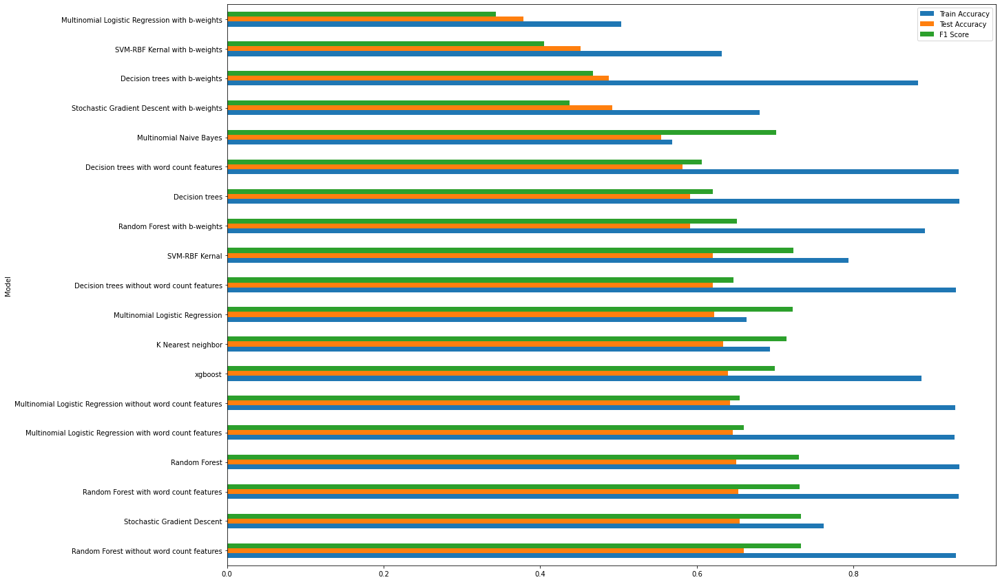

In [151]:
df_resLog.plot(kind='barh',x='Model', figsize=[20,15])

**Observations**:

*   Random forest, Xgboost and
Decision Tree seems to be overfitting
due to high difference in Training
and test accuracy

*   F1 score is higher than accuracy
because it is calculated for the
target group present in y_pred (lesser
than the y_train ) Class Imbalance

*   The best performing model “ Stochastic
Gradient Descent” performance reduces
drastically from 65.44% to 49.19% once the
parameter class_weight = ‘balanced'

*   K NN, Xgboost and Random Forest seem to
handle imbalance better than SGD.

*   Meanwhile, SGD, SVM and Naïve Bayes might
perform better if the class imbalance is taken
care

*   Vectorized input with 'Max features' = 12270 is quiet a high dimension for SGD, MultinomialNB, KNN. It takes a long time to converge. Max features less than 1000 does not give a good performance.

*   The vectorized input with Max features = 12270 improved the performance for Multinomial Logistic Regression, Random Forest & Decision Tree - Handles high dimension better

*   Addition word count features to the input dataframe does not add much value to the perfomance.
*   List item

*   SVM (RBF Kernel) and Xgboost seems to take a lot of time for execution compared to others even for lesser dimensional input. Thus avoided modelling with vectorized input.



## **Deep Learning Models**

### **Neural Network**

In [74]:
tfidf = TfidfVectorizer(max_features=250, analyzer = 'word', min_df=2, max_df=0.95, ngram_range=(1, 2))
tckt_tfidf = tfidf.fit_transform(ticket_df['tokenized_desc'])

In [75]:
x = tckt_tfidf.toarray()
y=ticket_df["LabelEncodings"]

In [76]:
## Splitting the data into train and test
from sklearn.model_selection import train_test_split
X_train_n,X_test_n,y_train_n,y_test_n=train_test_split(x,y,test_size=0.2, random_state=1)
## Printing the shape of train and test sets
print(X_train_n.shape)
print(y_train_n.shape)
print(X_test_n.shape)
print(y_test_n.shape)

(6744, 250)
(6744,)
(1687, 250)
(1687,)


In [77]:
y_train_n = np.array(y_train_n.values.tolist())
y_test_n = np.array(y_test_n.values.tolist())

In [78]:
from tensorflow.keras.utils import to_categorical

print("Value of train labels before encoding:", y_train_n[0])
print("Value of test labels before encoding:", y_test_n[0])

y_train_nn = to_categorical(y_train_n)
y_test_nn = to_categorical(y_test_n)

print("Shape of y_train_nn:", y_train_nn.shape)
print("One hot encoded value of y_train_nn:", y_train_nn[0])
print("Shape of y_test_nn:", y_test_nn.shape)
print("One hot encoded value of y_test_nn:", y_test_nn[0])

Value of train labels before encoding: 2
Value of test labels before encoding: 39
Shape of y_train_nn: (6744, 68)
One hot encoded value of y_train_nn: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Shape of y_test_nn: (1687, 68)
One hot encoded value of y_test_nn: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [79]:
nn_model = Sequential()
nn_model.add(Dense(500, input_shape=(len(X_train_n[0]),), activation='relu'))
nn_model.add(Dropout(0.5))
nn_model.add(Dense(200, activation='relu'))
nn_model.add(Dropout(0.3))
nn_model.add(Dense(100, activation='relu'))
nn_model.add(Dropout(0.2))
nn_model.add(Dense(68, activation='softmax', name='Output'))


In [80]:
sgd = SGD(learning_rate=0.01, decay=1e-6, momentum=0.9, nesterov=True)
nn_model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])

In [81]:
nn_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 500)               125500    
_________________________________________________________________
dropout_6 (Dropout)          (None, 500)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 200)               100200    
_________________________________________________________________
dropout_7 (Dropout)          (None, 200)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 100)               20100     
_________________________________________________________________
dropout_8 (Dropout)          (None, 100)               0         
_________________________________________________________________
Output (Dense)               (None, 68)               

In [82]:
hist = nn_model.fit(X_train_n, y_train_nn, validation_split = 0.2, epochs=50, batch_size=32, verbose=1)

Epoch 1/50
169/169 [==============================] - 1s 4ms/step - loss: 2.8105 - accuracy: 0.4560 - val_loss: 2.3881 - val_accuracy: 0.4722
Epoch 2/50
169/169 [==============================] - 1s 4ms/step - loss: 2.3077 - accuracy: 0.5186 - val_loss: 2.1417 - val_accuracy: 0.5456
Epoch 3/50
169/169 [==============================] - 1s 4ms/step - loss: 2.1352 - accuracy: 0.5385 - val_loss: 2.0453 - val_accuracy: 0.5441
Epoch 4/50
169/169 [==============================] - 1s 4ms/step - loss: 2.0721 - accuracy: 0.5379 - val_loss: 2.0064 - val_accuracy: 0.5456
Epoch 5/50
169/169 [==============================] - 1s 4ms/step - loss: 2.0231 - accuracy: 0.5414 - val_loss: 1.9753 - val_accuracy: 0.5545
Epoch 6/50
169/169 [==============================] - 1s 3ms/step - loss: 1.9808 - accuracy: 0.5488 - val_loss: 1.9299 - val_accuracy: 0.5745
Epoch 7/50
169/169 [==============================] - 1s 4ms/step - loss: 1.9146 - accuracy: 0.5594 - val_loss: 1.8808 - val_accuracy: 0.5723
Epoch 

In [83]:
print('Test accuracy is:')
nn_model.evaluate(X_test_n,y_test_nn)

Test accuracy is:
53/53 [==============================] - 0s 2ms/step - loss: 1.6322 - accuracy: 0.6242


[1.6322323083877563, 0.6241849660873413]

In [84]:
nn_test_acc = hist.history['accuracy']
nn_val_acc = hist.history['val_accuracy']
nn_test_loss = hist.history['loss']
nn_val_loss = hist.history['val_loss']

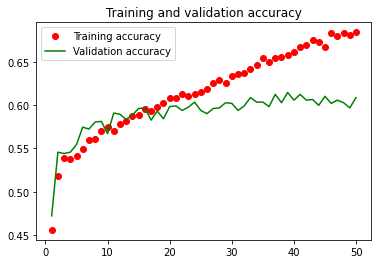

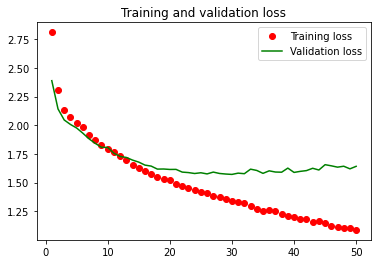

In [85]:
epochs = range(1, len(nn_test_acc) + 1)

plt.plot(epochs, nn_test_acc, 'ro', label='Training accuracy')
plt.plot(epochs, nn_val_acc, 'g', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, nn_test_loss, 'ro', label='Training loss')
plt.plot(epochs, nn_val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()